# Get video and joints data

In [23]:
import numpy as np
import json
import cv2
import pandas as pd
from scipy import ndimage
import matplotlib.pylab as plt
files = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/files_used_first_move.npy")
files = [elem.decode("utf-8") for elem in files]
videos_p = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/pitcher_first_move.npy")
print("loaded pitcher", videos_p.shape)
#videos_b = np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter_first_move.npy")
#print("loaded batter", videos_b.shape)

loaded pitcher (44, 167, 110, 110)


In [24]:
def get_data(index, cf):
    begin_cf = cf.columns.get_loc("0")
    data_array = cf.iloc[index, begin_cf:begin_cf+167].values
    N = len(data_array)

    nr_joints = len(eval(data_array[0]))
    
    data = np.zeros((N,nr_joints,2))

    for j in range(N):
        if not pd.isnull(data_array[j]):
            data[j]=np.array(eval(data_array[j]))
        else:
            data[j] = data[j-1]
    return data


cf = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/sv_data.csv")
# cf = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/cf_data.csv")
cf_pitcher = cf[cf["Player"]=="Pitcher"]
cf_batter = cf[cf["Player"]=="Batter"]
games = cf_pitcher["Game"].values.tolist()
positions = cf_pitcher["Pitching Position (P)"].values
pitchtypes = cf_pitcher["Pitch Type"].values
games_batter = cf_batter["Game"].values.tolist()
# labels = cf["first_movement_frame_index"].values
joints_array = []
#joints_array_batter = []
pos = []
pitch_type = []
not_in_csv = []
for i, filename in enumerate(files):
    # print(filename)
    game = filename
    try:
        ind = games.index(game)
        pos.append(positions[ind])
        pitch_type.append(pitchtypes[ind])
        #ind_batter = games_batter.index(game)
        joints_array.append(get_data(ind, cf_pitcher))
    except:
        print(i,filename)
        not_in_csv.append(i)
    #joints_array_batter.append(get_data(ind_batter, cf_batter))
joints_array = np.array(joints_array)
#joints_array_batter = ndimage.filters.gaussian_filter1d(np.array(joints_array_batter), axis =1, sigma = 3)
joints_array = ndimage.filters.gaussian_filter1d(joints_array, axis =1, sigma = 3)
print(joints_array.shape) #, joints_array_batter.shape)
print(pitch_type, pos)

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,

10 491001-81f2cc4b-416a-4982-86b2-8ba9d33229d7
13 491001-576caa0a-69e2-41ea-a817-1d56c4762546
16 491001-88cc0047-2e82-416f-ab4f-8666f4a2999b
21 491001-3ca15755-21bd-438d-9b26-38a9fd38026c
23 491001-d139c238-290f-4d22-b87a-02770ec03860
29 491001-171a75f3-6aaa-4109-86c7-1dde4dda4c3b
30 491001-9bb6bebc-8e30-4a98-a232-391ef0df999c
(37, 167, 18, 2)
['Curveball', 'Knuckleball', 'Fastball (2-seam)', 'Knuckleball', 'Knuckleball', 'Knuckleball', 'Knuckleball', 'Changeup', 'Fastball (2-seam)', 'Knuckleball', 'Fastball (4-seam)', 'Knuckleball', 'Fastball (4-seam)', 'Fastball (4-seam)', 'Changeup', 'Knuckleball', 'Curveball', 'Curveball', 'Slider', 'Fastball (2-seam)', 'Fastball (2-seam)', 'Knuckleball', 'Knuckleball', 'Fastball (2-seam)', 'Fastball (4-seam)', 'Fastball (4-seam)', 'Fastball (4-seam)', 'Knuckleball', 'Knuckleball', 'Fastball (2-seam)', 'Knuckleball', 'Knuckleball', 'Knuckleball', 'Fastball (2-seam)', 'Slider', 'Fastball (4-seam)', 'Slider'] ['Windup', 'Stretch', 'Stretch', 'Stretch

In [25]:
remove = not_in_csv[::-1]
print(remove)
for i in remove:
    files = np.delete(files, i)
    videos_p = np.delete(videos_p, i, axis = 0)
print(files.shape, videos_p.shape)

[30, 29, 23, 21, 16, 13, 10]
(37,) (37, 167, 110, 110)


# First movement prediction

In [26]:
def only_first(move, minimum_sequ_len = 1):
    while True:
        for i in range(minimum_sequ_len):
            if move[0]!=move[1]-1:
                move = np.delete(move, 0)
            else:
                return move[0]

In [27]:
def first_by_grad(frames_joints_array, relevant_joints_list, cutoff):
    """ 
    frames_joint_array must have size (nr_frames, 18/12 (joints))
    relevant_joints_list: the joints which should be taken into account for the movement
    """
    #frames_joints_array = ndimage.filters.gaussian_filter1d(frames_joints_array, axis =0, sigma = 3)
    gradients = np.array([np.gradient(frames_joints_array[:,joints_list.index(j)], edge_order = 2) 
                          for j in relevant_joints_list]) #["right_knee", "right_ankle", "left_knee", "left_ankle"]])
    # print(gradients.shape)
    mean_gradient = np.mean(gradients, axis=0)
    #print(mean_gradient)
    if cutoff>0:
        move = np.where(mean_gradient>cutoff)[0] 
    else: 
        move = np.where(mean_gradient<cutoff)[0] 
    print("first_by_grad", move)
    if len(move)>1:
        return only_first(move)
    elif len(move)==1:
        return move[0]
    else:
        return None

In [28]:
def first_leg(frames_joints_array, relevant_joints_list, cutoff):
    joints_cut = len(relevant_joints_list)//2
    right_leg = first_by_grad(frames_joints_array, relevant_joints_list[:joints_cut], cutoff)
    left_leg = first_by_grad(frames_joints_array, relevant_joints_list[joints_cut:], cutoff)
    if right_leg is not None and left_leg is not None:
        return min(right_leg, left_leg)
    elif right_leg is not None:
        return right_leg
    elif left_leg is not None:
        return left_leg
    else:
        return None

In [29]:
def grad_sum(frames_joints_array, relevant_joints_list, cutoff):
    gradients = np.array([np.gradient(frames_joints_array[:,joints_list.index(j)], edge_order = 2) 
                          for j in relevant_joints_list]) #["right_knee", "right_ankle", "left_knee", "left_ankle"]])
    sum_grad = np.sum(np.absolute(gradients), axis = 0)
    #plt.figure(figsize=(20,10))
    #plt.plot(sum_grad)
    #plt.show()
    return np.where(sum_grad>cutoff)[0][0]

In [48]:
def local_maxima(frames_joints_array, relevant_joints_list, cutoff):
    gradients = np.array([np.gradient(frames_joints_array[:,joints_list.index(j)], edge_order = 2) 
                          for j in relevant_joints_list]) #["right_knee", "right_ankle", "left_knee", "left_ankle"]])
    sum_grad = np.sum(np.absolute(gradients), axis = 0)
    from scipy.signal import argrelextrema
    argInd  = argrelextrema(sum_grad, np.greater)[0]
    print(argInd)
    cut = np.where(sum_grad[argInd]>cutoff)[0]
    print(argInd[cut])
    return argInd[cut[0]]

In [9]:
def center_gravity_plotting(center):
    fig = plt.figure()
    ax= fig.add_subplot(111)
    plt.plot(center[:,1], center[:,0])
    for k in range(167):
        if k%10==0:
            ax.annotate(str(k), (center[k,1], center[k,0]))
    plt.ylim(max(center[:,0])+3, min(center[:,0])-3)
    plt.grid()
    plt.show()
    plt.figure()
    xy_norm = np.linalg.norm(center, axis = 1)
    #plt.plot(xy_norm, label = "norm")
    smooth = ndimage.filters.gaussian_filter1d(xy_norm, axis=0, sigma = 3)
    #plt.plot(smooth, label = "sm")
    gradient = np.gradient(smooth)
    plt.plot(gradient, label = "grad")
    plt.legend()
    plt.show()
    
def center_gravity(pitch_or_bat_arr, joint_weights = np.ones(12), cutoff=0.5):
    """array must be of size (nr_frames, joints, coordinates)"""
    norm_weights = joint_weights/float(np.sum(joint_weights))
    assert(len(norm_weights)==len(pitch_or_bat_arr[0]))
    center = np.average(pitch_or_bat_arr, axis = 1, weights = norm_weights)
    xy_norm = np.linalg.norm(center, axis = 1)
    smooth = ndimage.filters.gaussian_filter1d(xy_norm, axis=0, sigma = 3)
    gradient = np.gradient(smooth)
    move = np.where(np.absolute(gradient)>cutoff)[0]
    #center_gravity_plotting(center)
    print("center_gravity", move)
    return only_first(move)
#center_gravity(joints_array[0,:,:12]) #, joint_weights=np.array([1,1, 0.3,0, 0.3, 0, 1, 2,0.5, 1, 2, 0.5]))

# Pitcher analysis

28


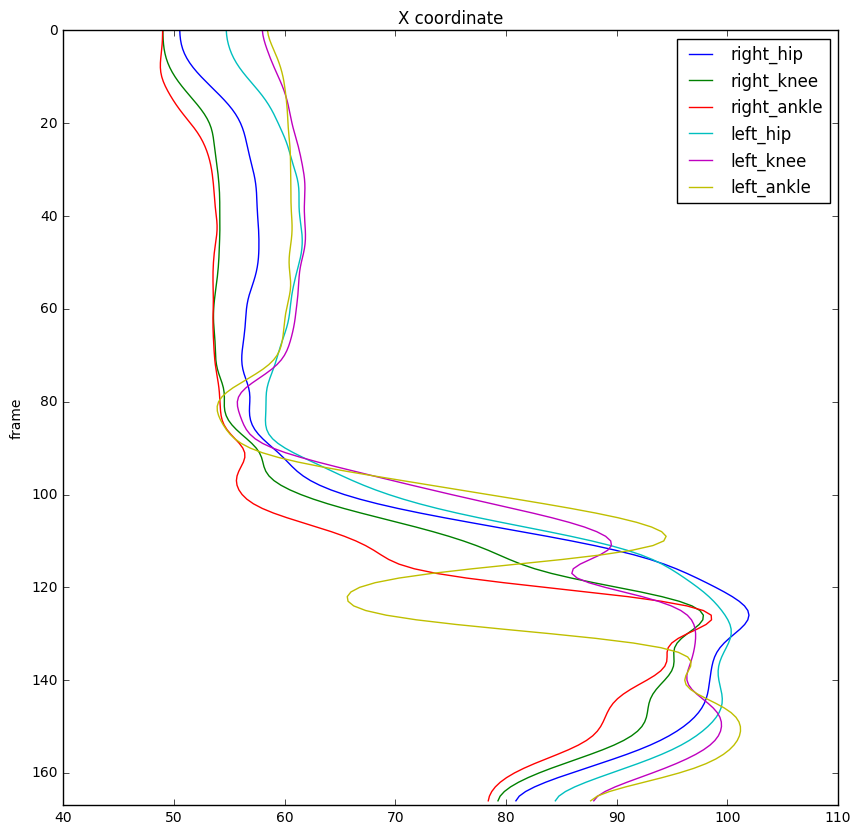

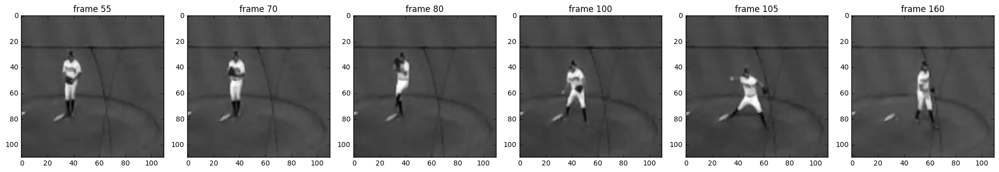

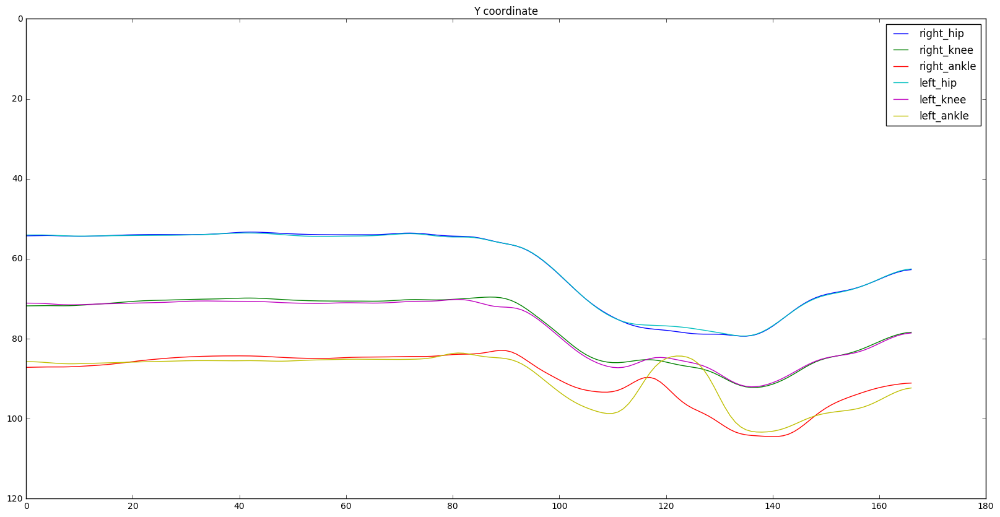

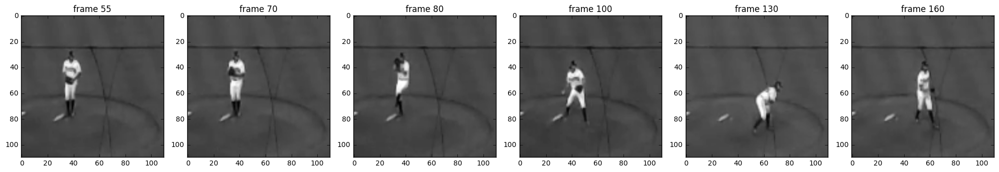

In [30]:
joints_list = ["right_shoulder", "left_shoulder", "right_elbow", "right_wrist","left_elbow", "left_wrist",
        "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
        "right_eye", "right_ear","left_eye", "left_ear"]
# print(files)
one_joint = "left_knee"
video_choice = 28 #files.tolist().index("490972-90db4c70-5f8f-4a49-acc6-1cc6fe2537e0")
print(video_choice)

plt.figure(figsize = (10,10))
for j in joints_list[6:12]:
    plt.plot(joints_array[video_choice,:,joints_list.index(j), 1], np.arange(0,167,1), label = j)
plt.title("X coordinate")
plt.ylim(167,0)
plt.ylabel("frame")
plt.legend()
plt.show()

# Plot video frames to visualize maxima in X coordinates
show_frames = [55, 70, 80, 100, 105, 160]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_p[video_choice,i])
    plt.title("frame "+str(i))
    plt.gray()
plt.tight_layout()
plt.show()


plt.figure(figsize = (20,10))
for j in joints_list[6:12]: #[one_joint]: 
    plt.plot(joints_array[video_choice,:,joints_list.index(j), 0], label = j)
plt.legend()
plt.ylim(120, 0)
plt.title("Y coordinate")
plt.show()

# Plot video frames to visualize maxima in Y coordinates
show_frames = [55, 70, 80, 100, 130, 160]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_p[video_choice,i])
    plt.title("frame "+str(i))
plt.tight_layout()
plt.show()

491001-6856e2dc-626d-4d9a-9494-e565192d27b7
(20,) ['Stretch', 'Windup', 'Stretch', 'Stretch', 'Windup', 'Windup', 'Stretch', 'Windup', 'Windup', 'Stretch', 'Windup', 'Windup', 'Windup', 'Windup', 'Windup', 'Windup', 'Windup', 'Stretch', 'Windup', 'Windup']


333
66
491001-2e627ca6-f435-4a8d-9b03-7d6a508a576f
Windup


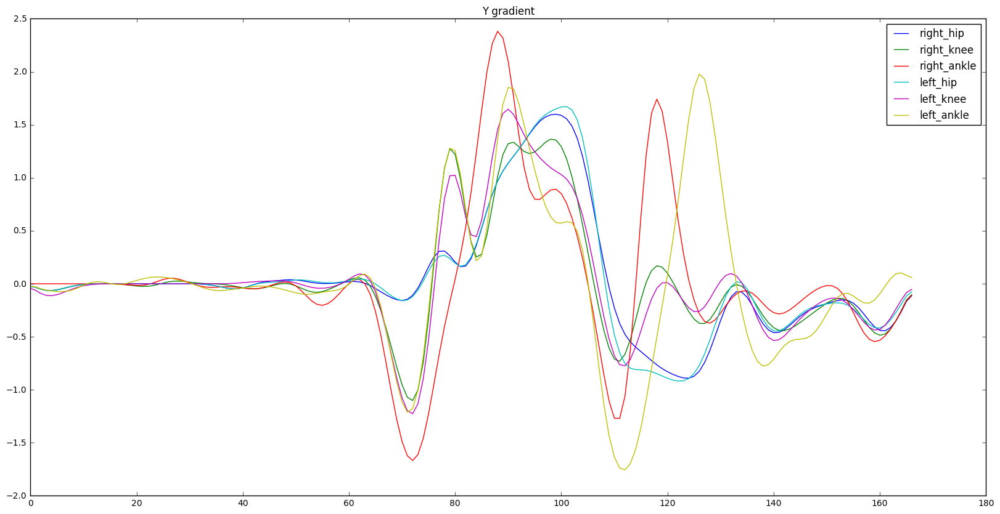

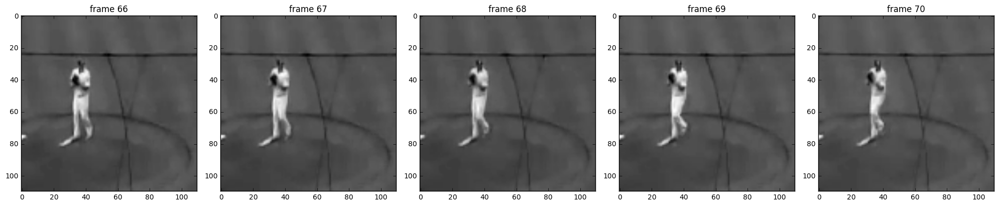

88
491001-8ceeb844-edec-44a4-a7b8-d5b93cbc0280
Stretch


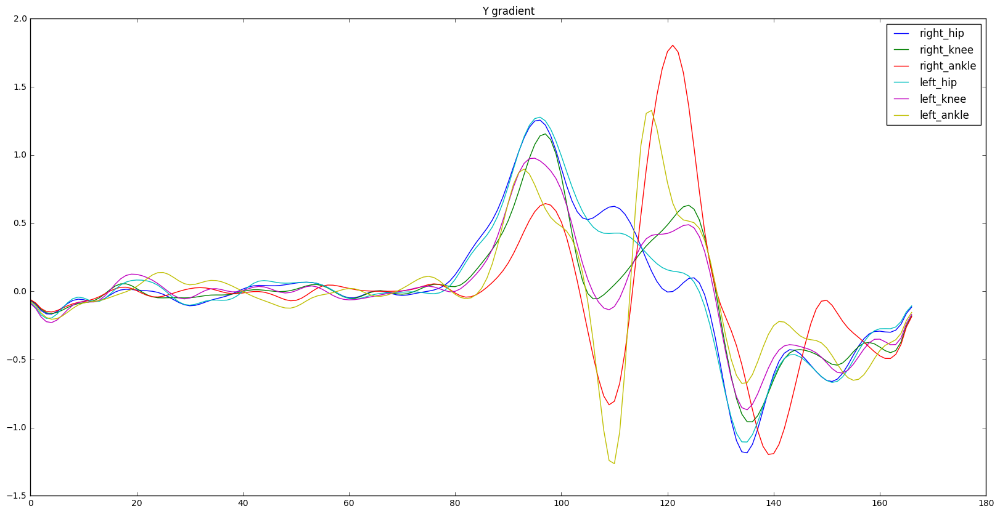

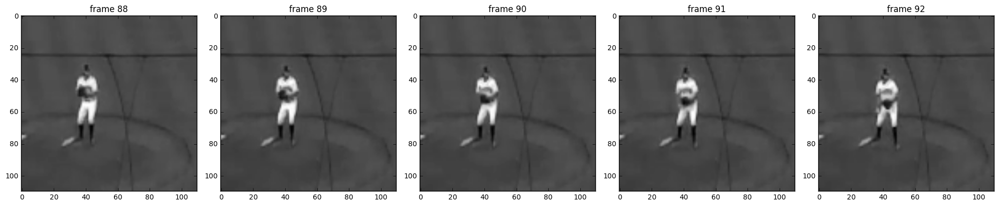

97
491001-f2e78c9f-ad7d-42de-bbf8-828627b72a1b
Stretch


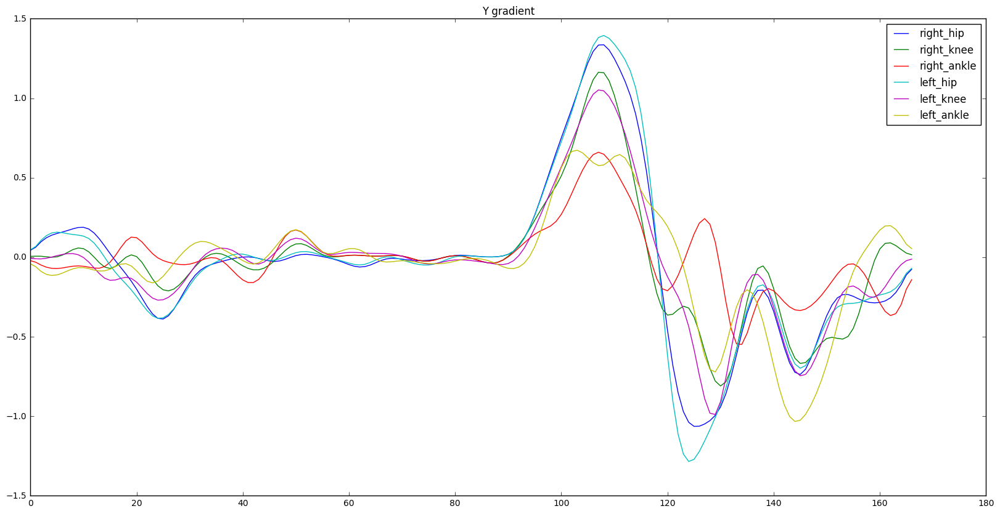

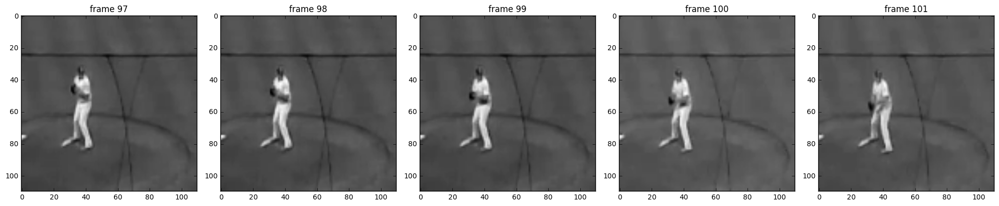

92
491001-8a5a8e5b-4ff4-4158-b77c-335c565de35d
Stretch


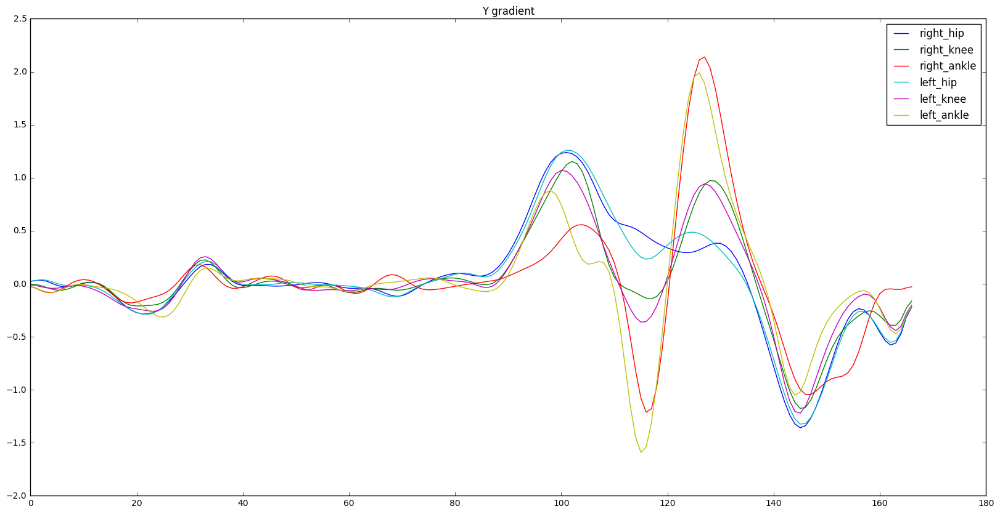

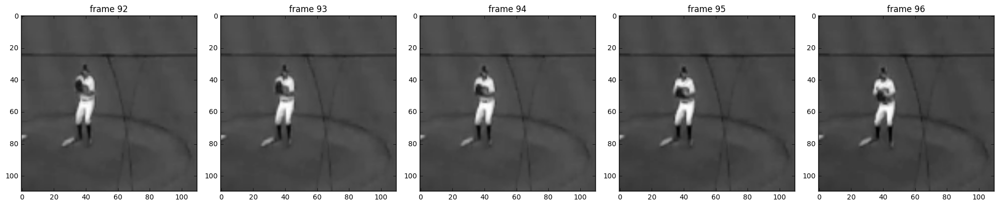

89
491001-46a57a77-dd30-4500-bf8a-dd3fb893ee25
Windup


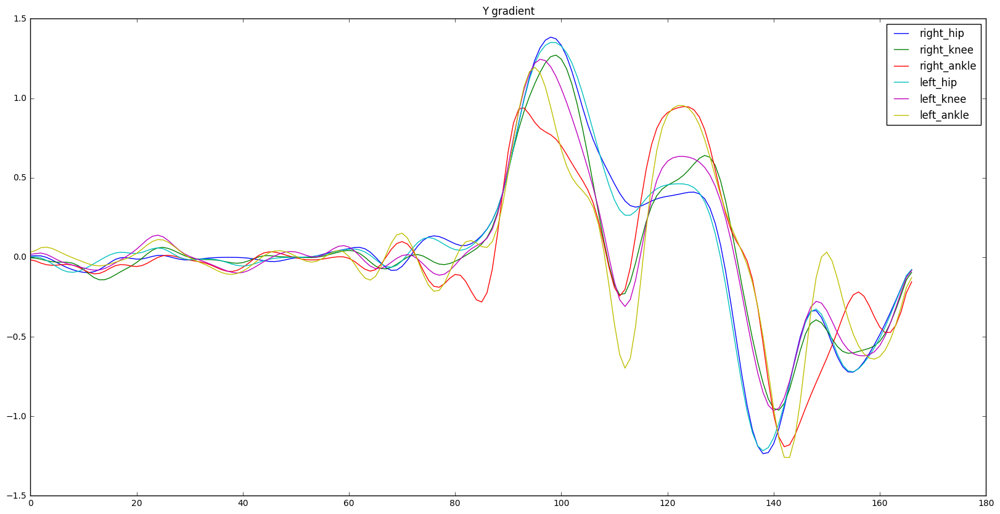

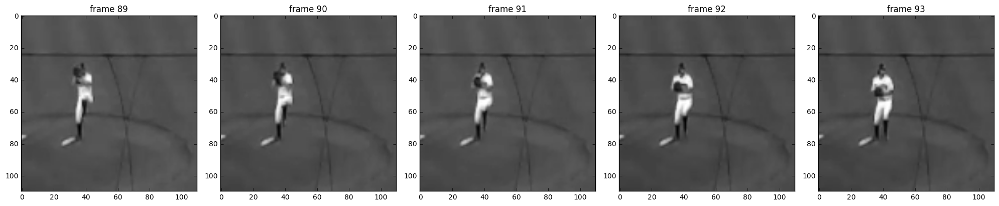

65
491001-aba95c1f-025a-4684-a989-fa1bed5166cb
Stretch


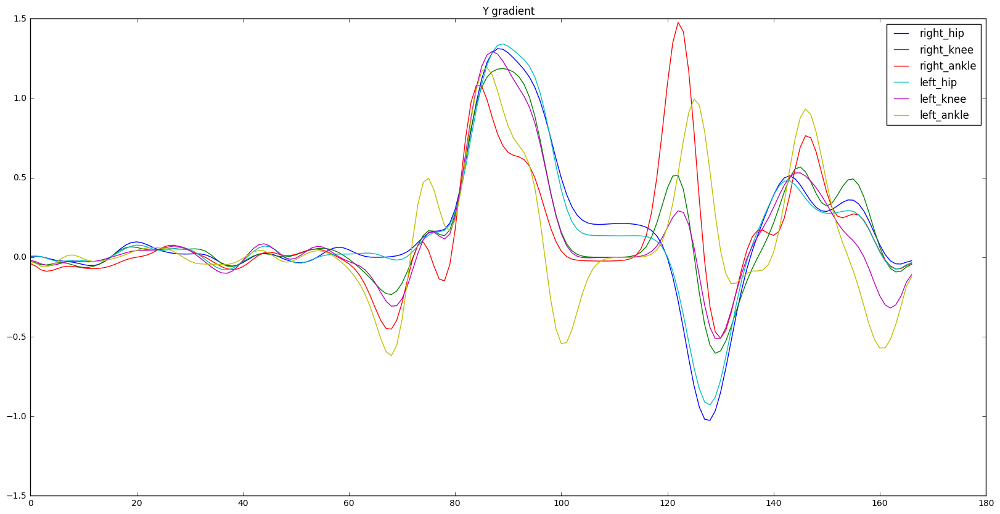

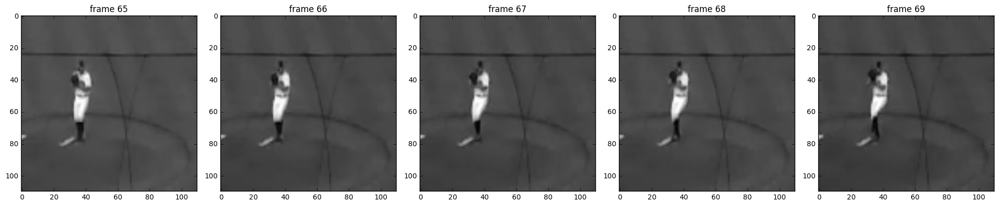

87
491001-07017e96-8e4b-4d82-aa61-96950e2a5bf0
Windup


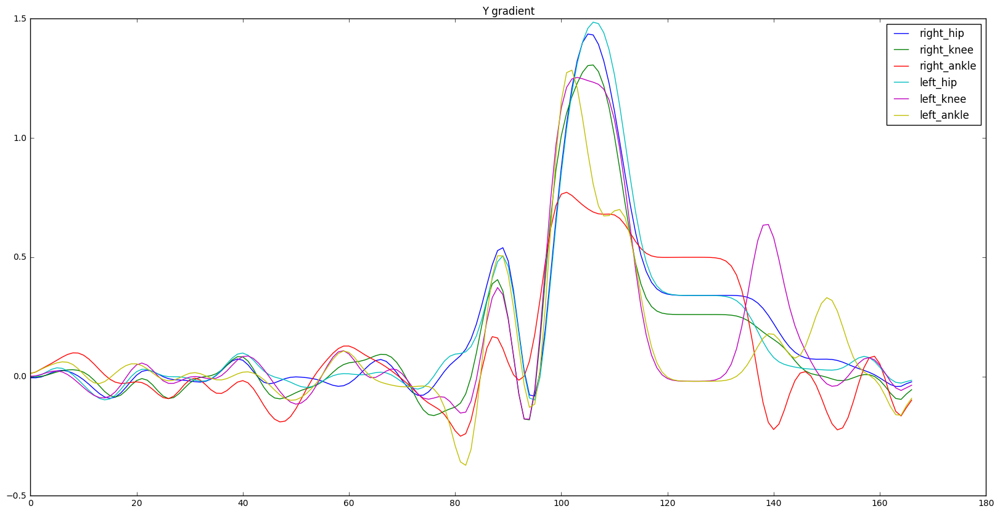

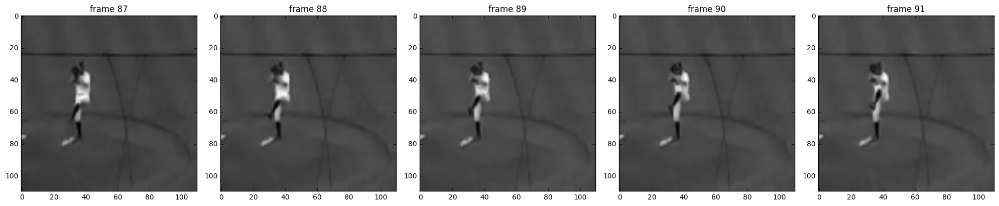

61
491001-d9c54cd4-6a26-4a64-bd12-838c8716421a
Windup


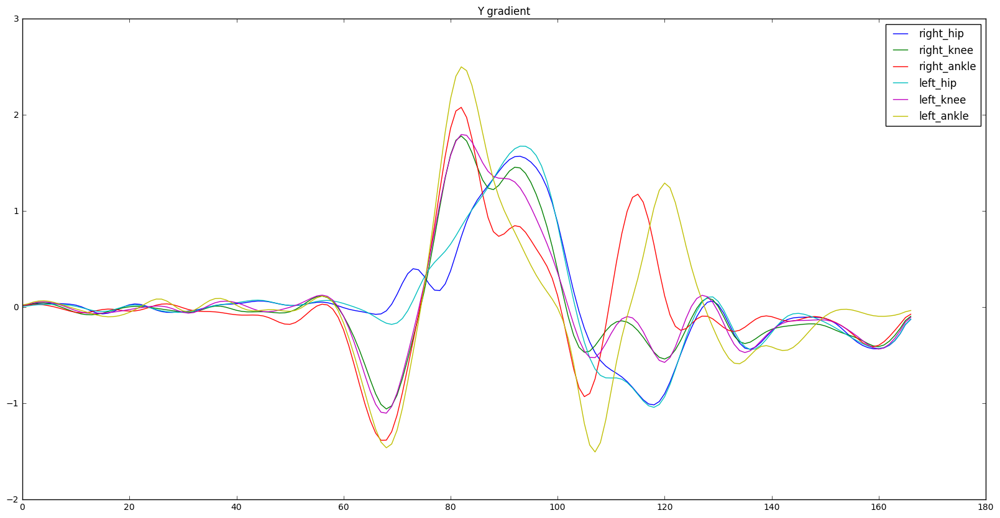

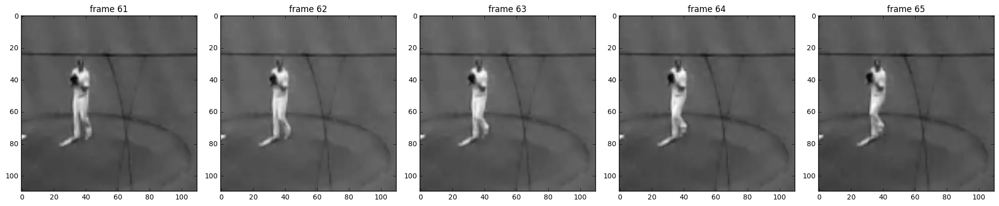

75
491001-e490c2eb-102d-48fa-b32f-4e09eec14d40
Stretch


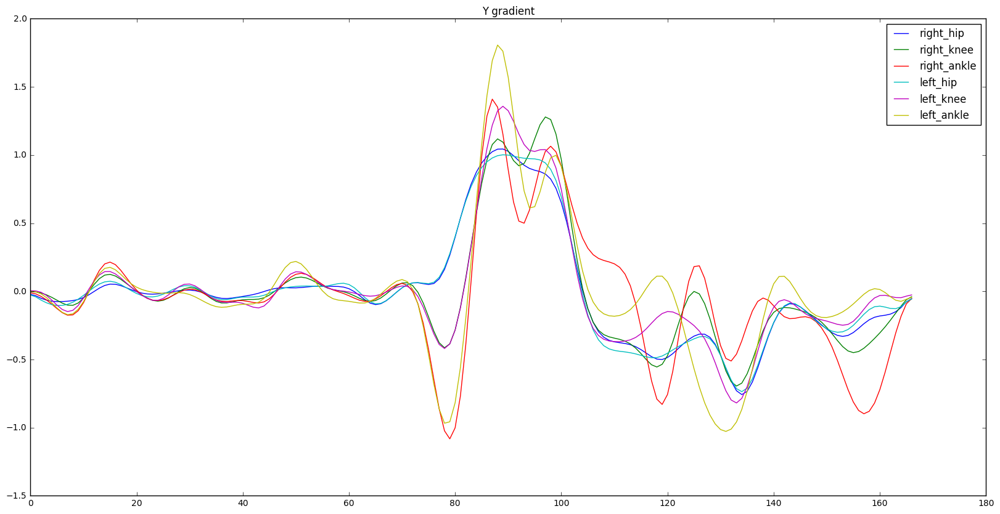

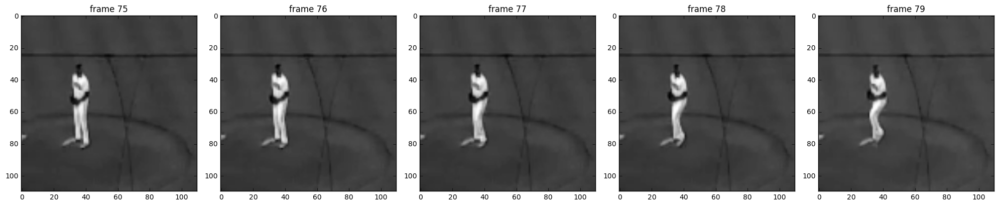

94
491001-071f340b-672b-437e-8f70-d27edc78bbfc
Windup


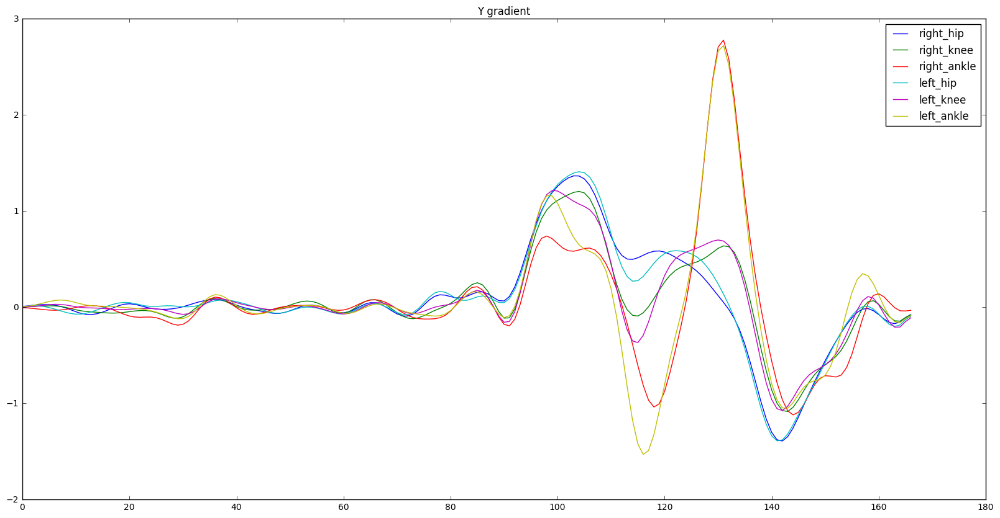

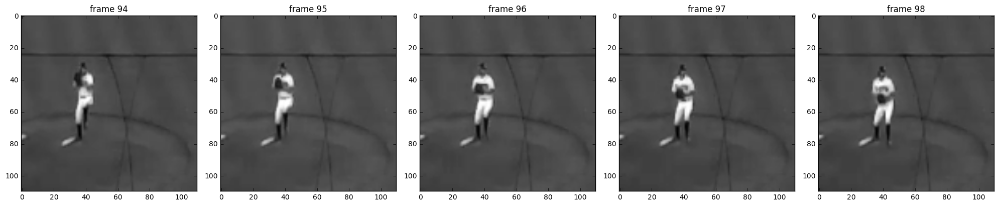

73
491001-f504ac51-73f7-4645-a41c-8eefc32f4c72
Stretch


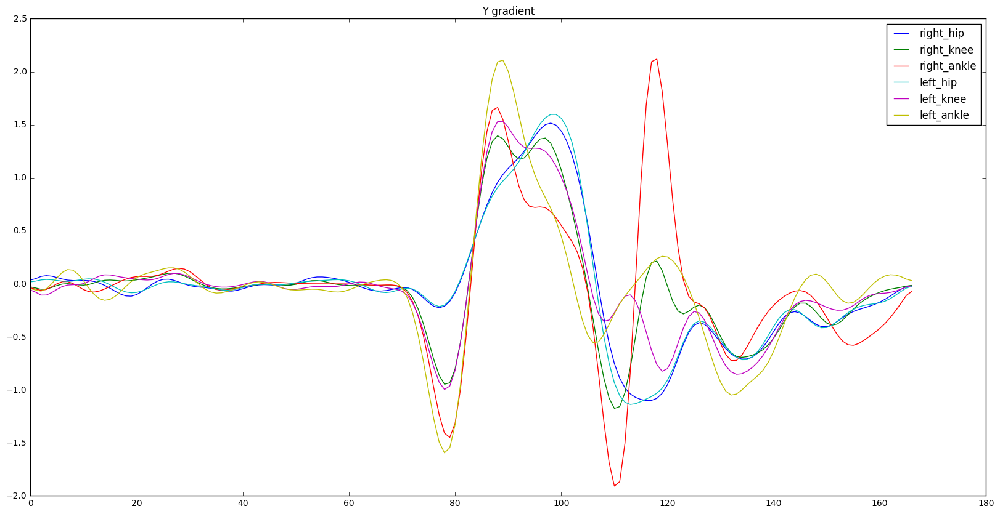

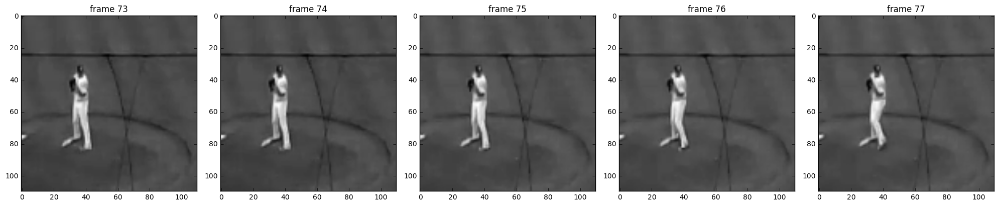

78
491001-40bb1f27-28e9-402d-8ddc-16639c8c8e4d
Windup


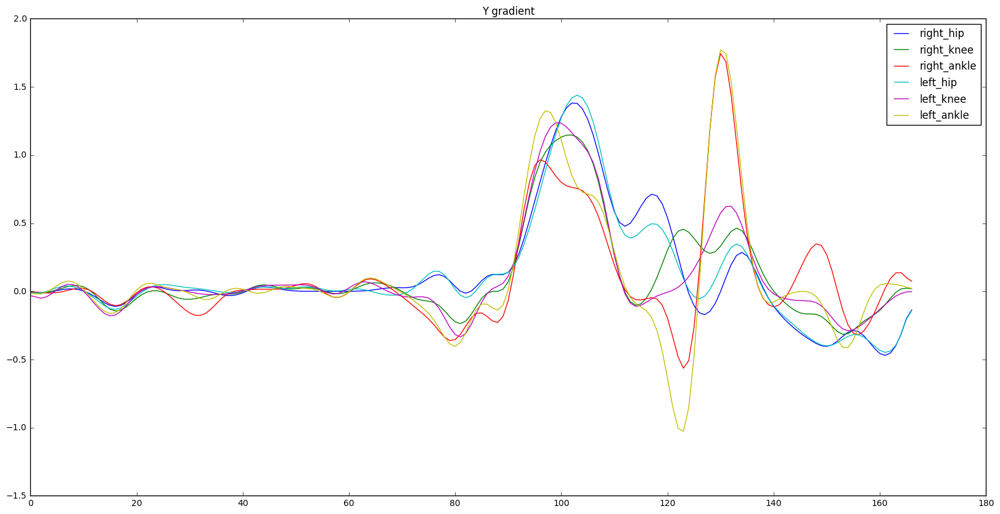

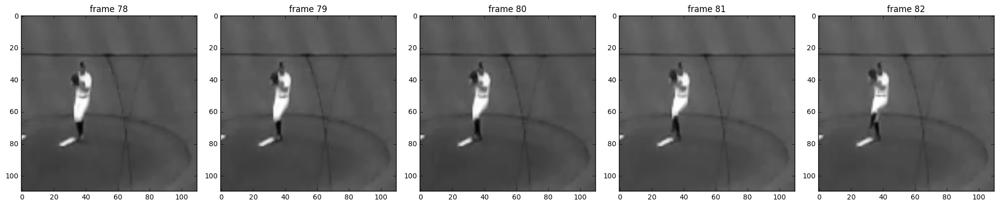

71
491001-e4a0b430-81df-454e-8633-c6216bba3641
Stretch


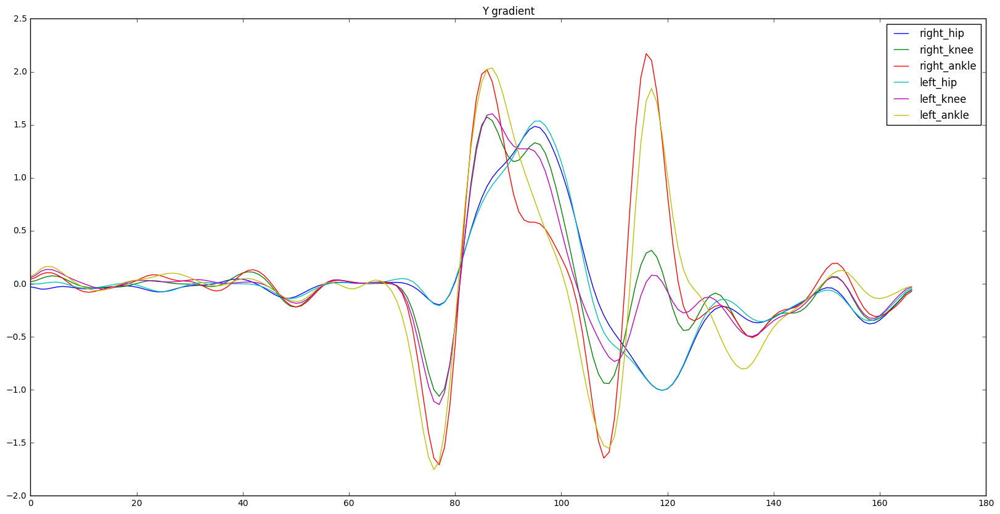

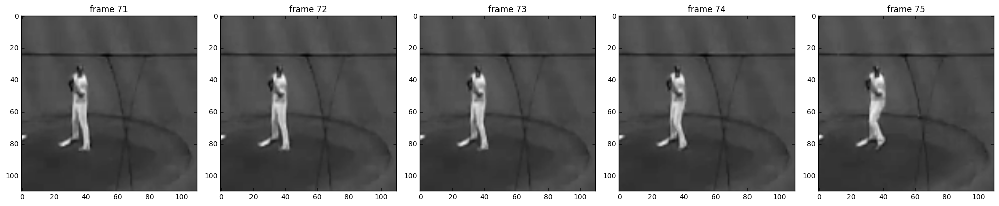

90
491001-69cad339-0478-45c5-96ed-97c6e813206b
Stretch


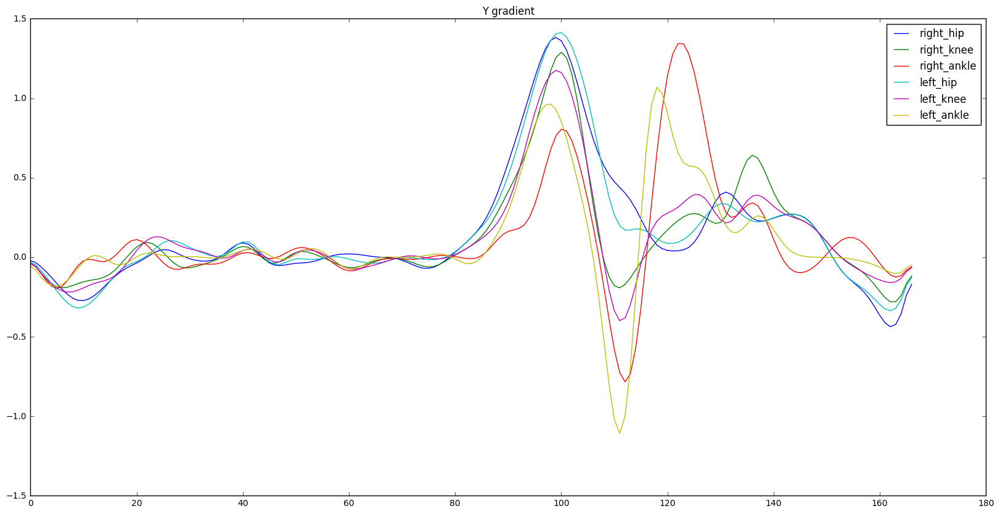

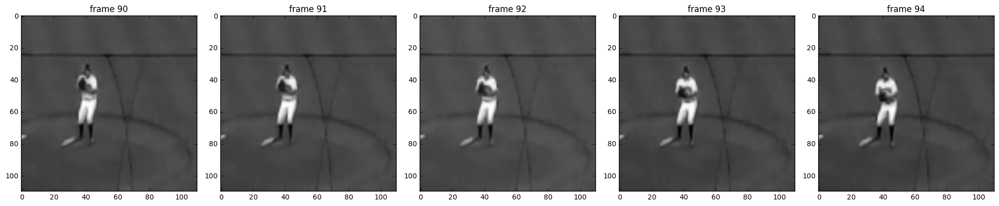

90
491001-a7177b5e-9b02-4aa8-8623-919a9cac8e6e
Stretch


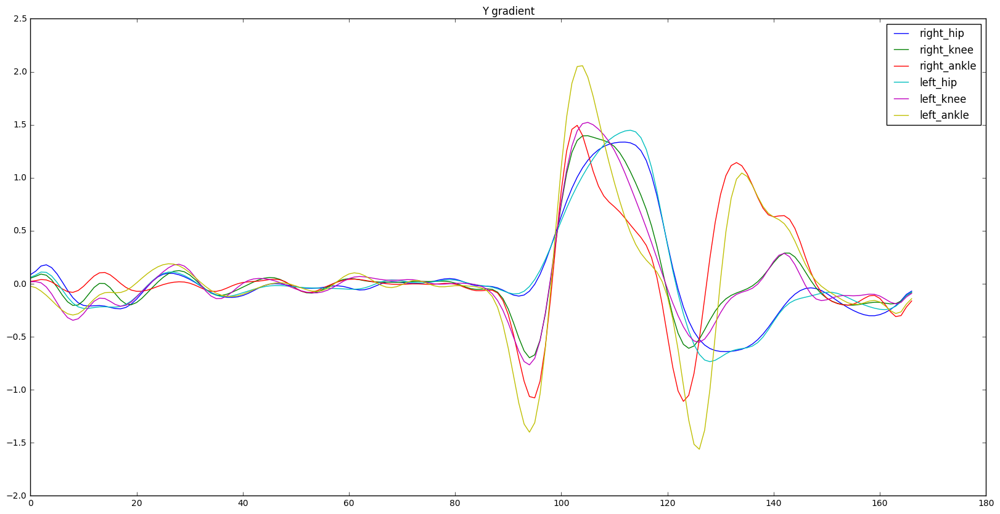

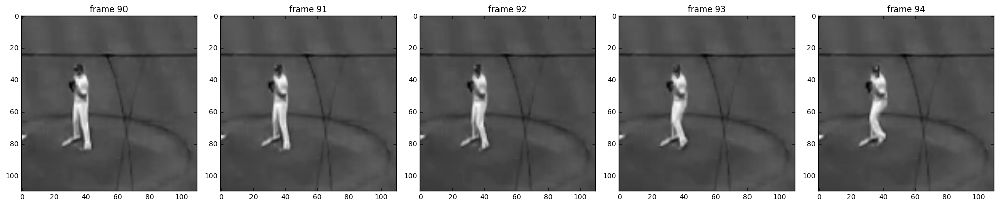

86
491001-363ecf99-4716-4594-bd80-54ff31c2ddf2
Windup


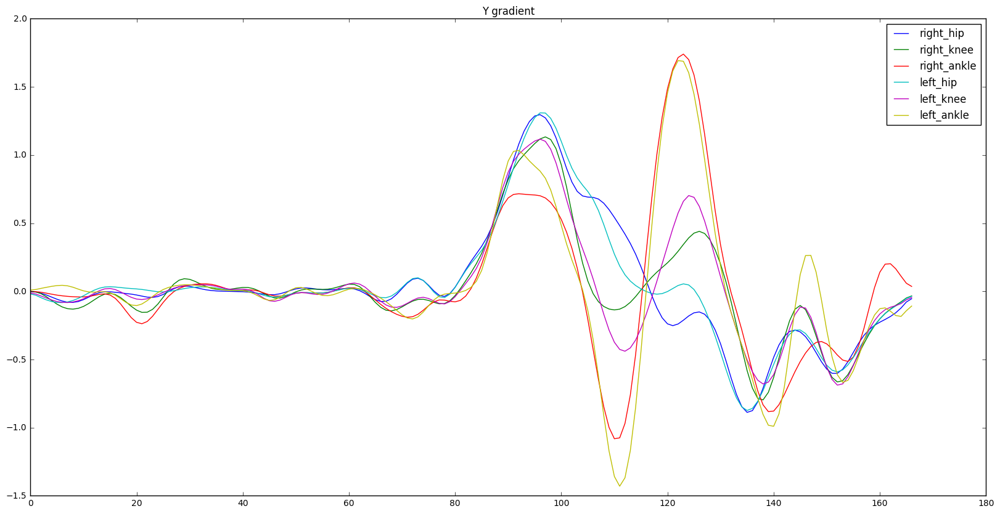

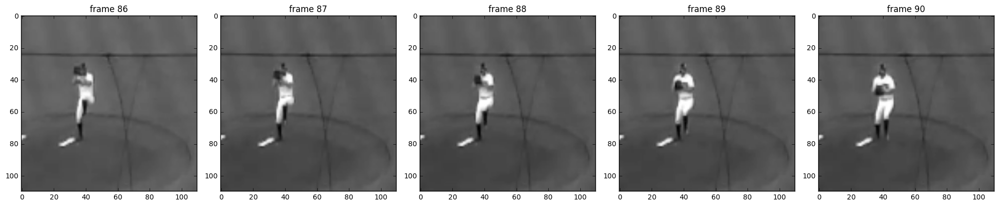

64
491001-4f1d86fb-8fa6-4bcc-81d5-cc5549dbb625
Windup


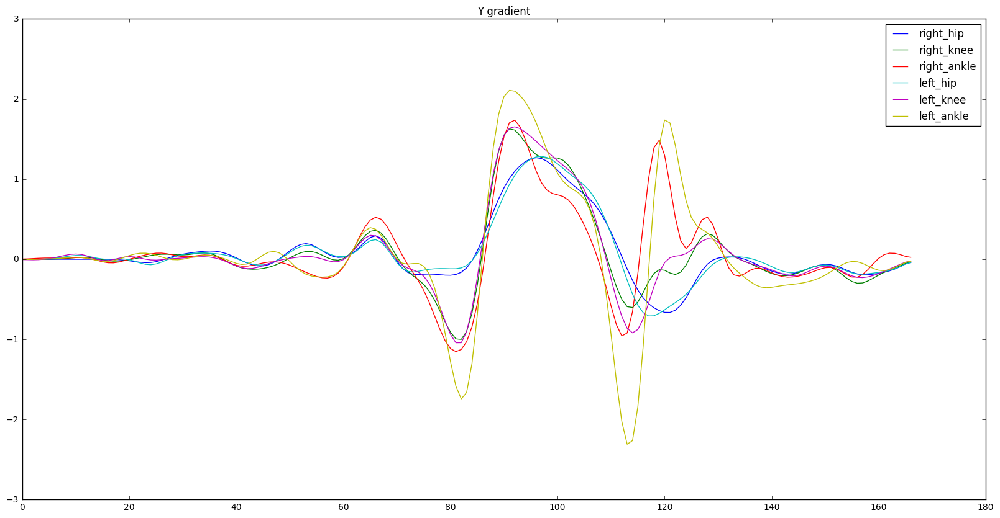

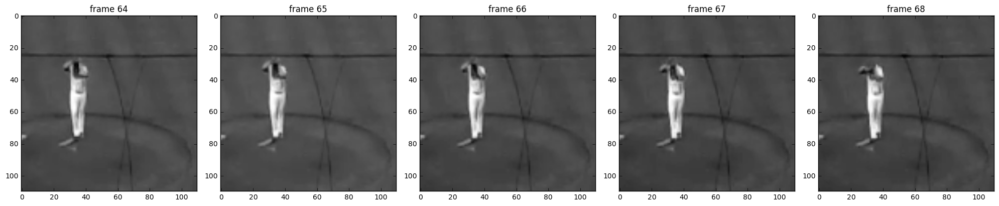

79
491001-b7975862-cbe7-4295-8f78-df915bdfab80
Windup


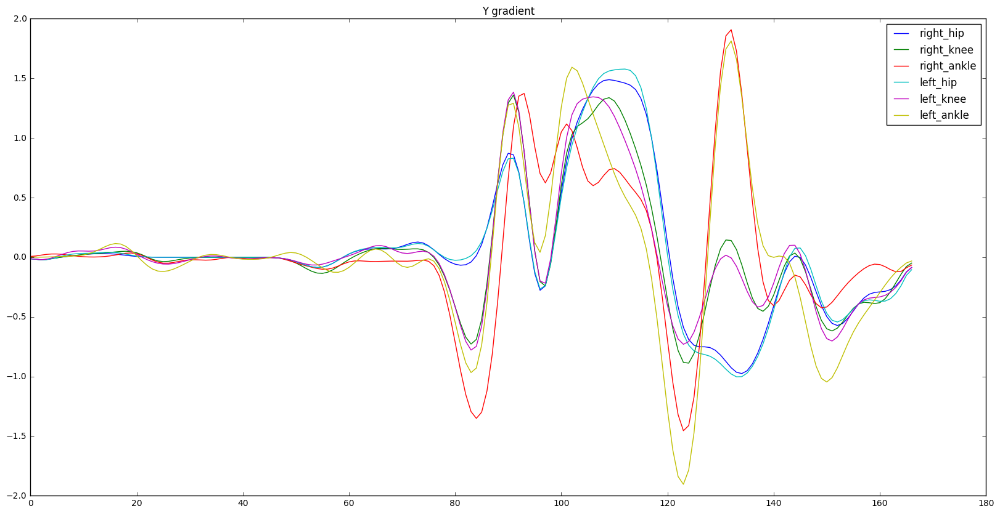

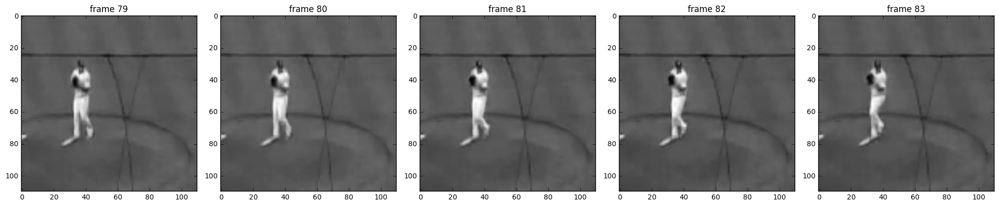

70
491001-c5fd6d05-c89b-415c-93bc-331e7247b480
Stretch


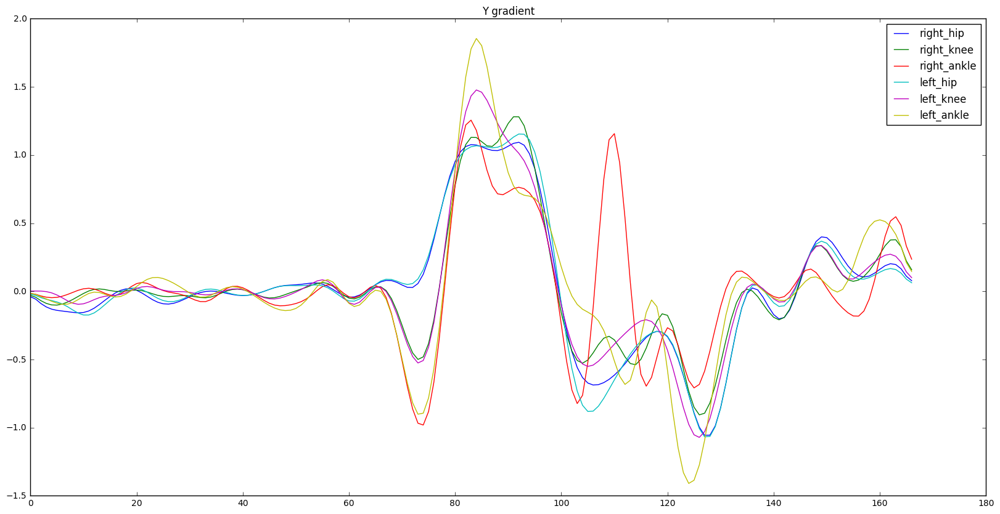

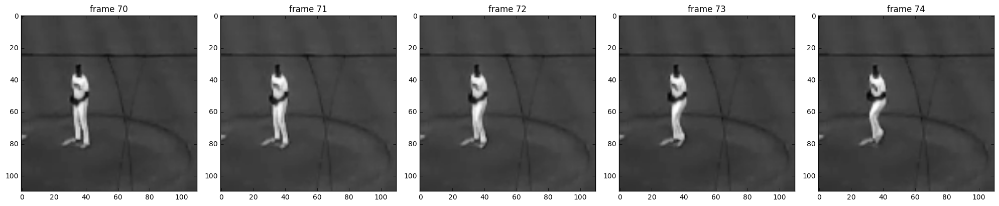

61
491001-937fb48a-d907-4c00-835c-f3c8f800eb66
Windup


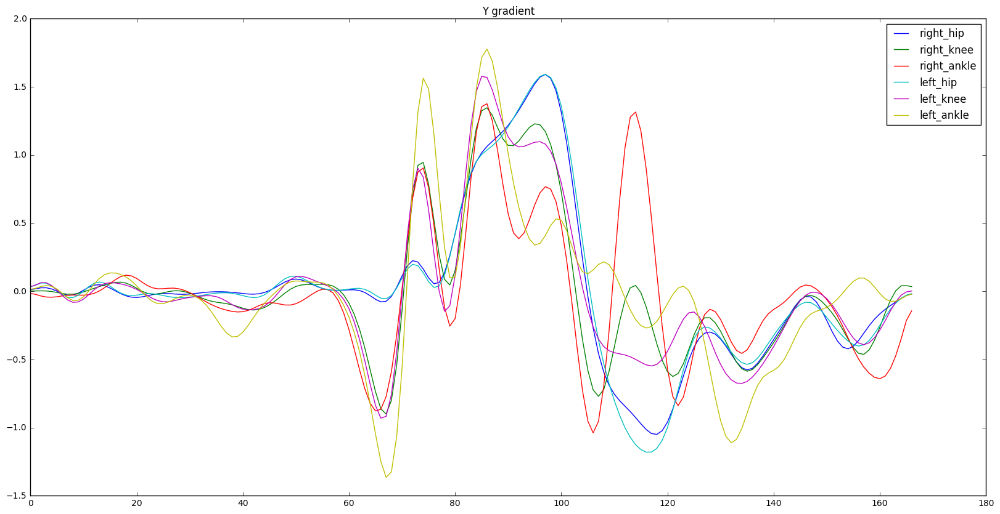

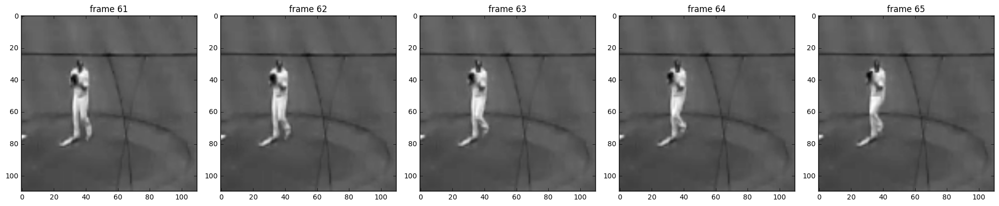

68
491001-b05970be-298b-487f-bc43-3e3a74271d86
Stretch


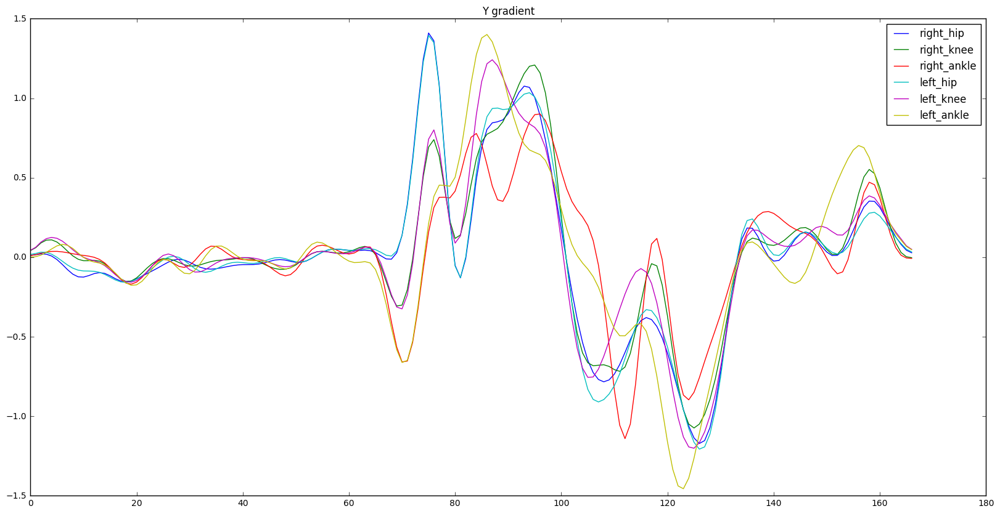

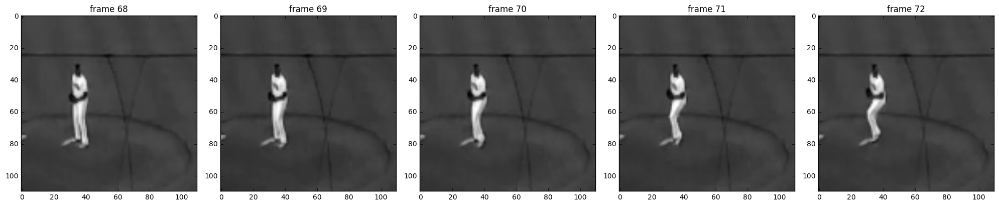

100
491001-78312295-33a4-48f4-b334-7e6f56ca161c
Stretch


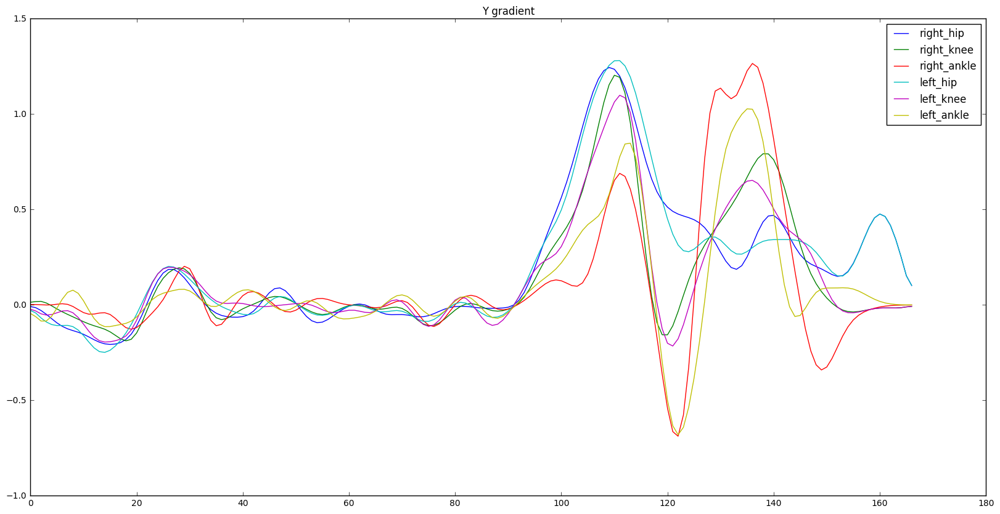

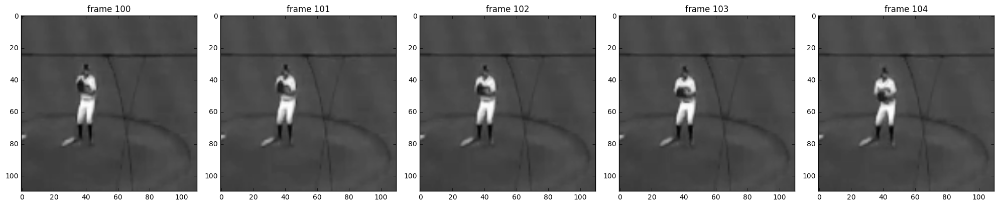

91
491001-68acc4ba-2ecc-48e8-bbad-a7c67cd24ae6
Windup


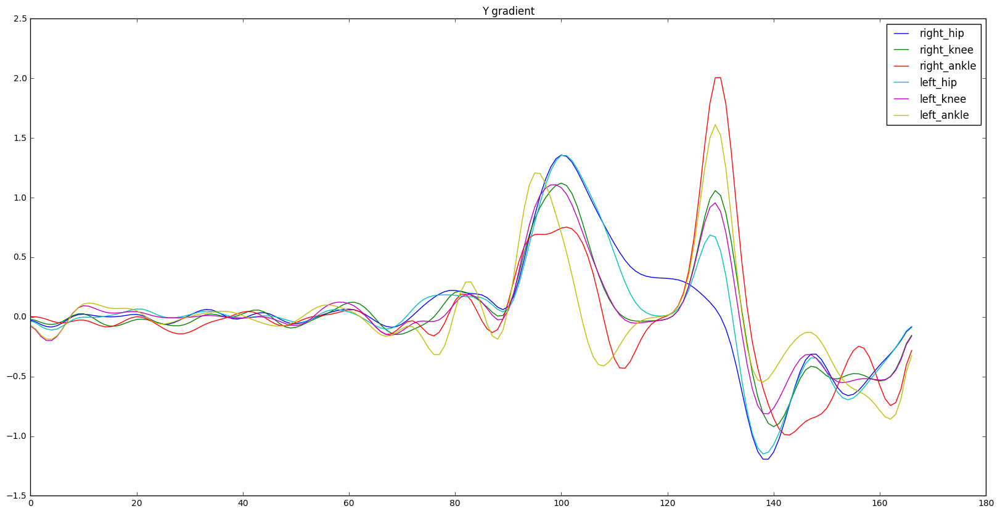

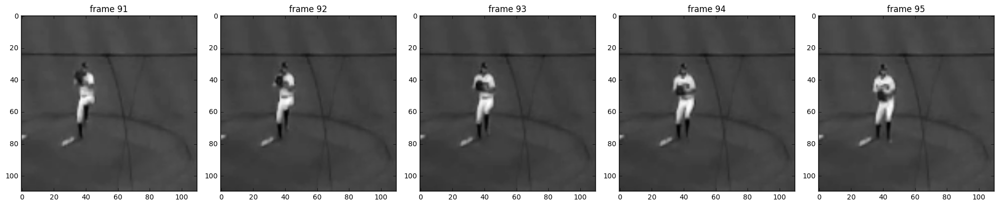

51
491001-353c6938-6e0a-4b9f-87f2-990929c260f0
Windup


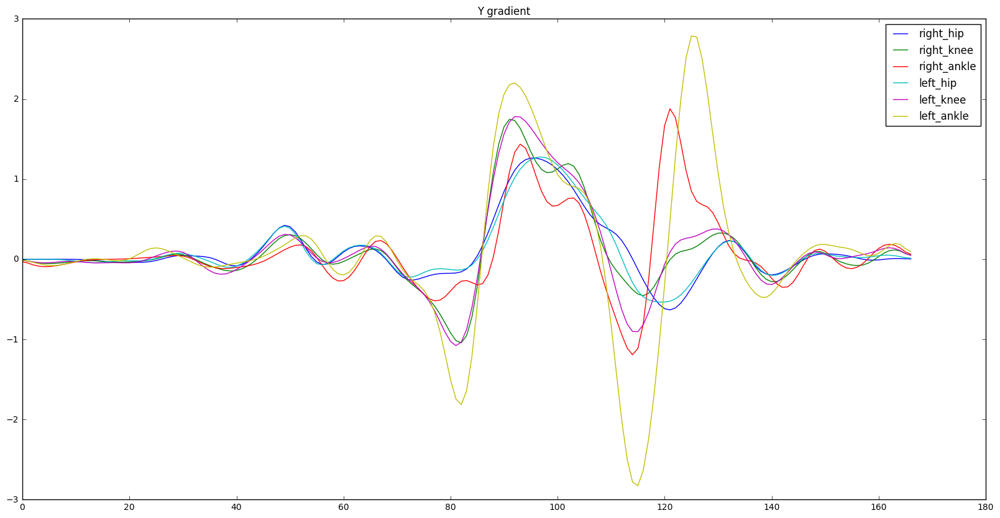

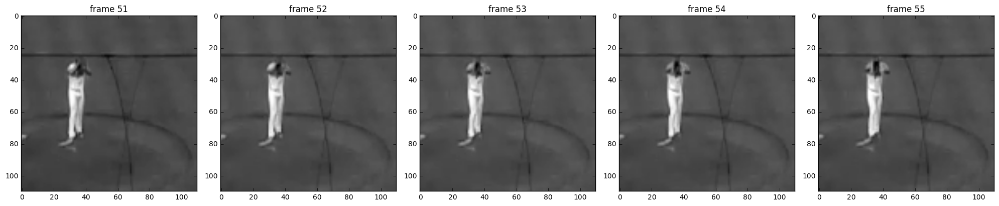

73
491001-1601a640-3f0f-41b1-b645-edc59307d379
Windup


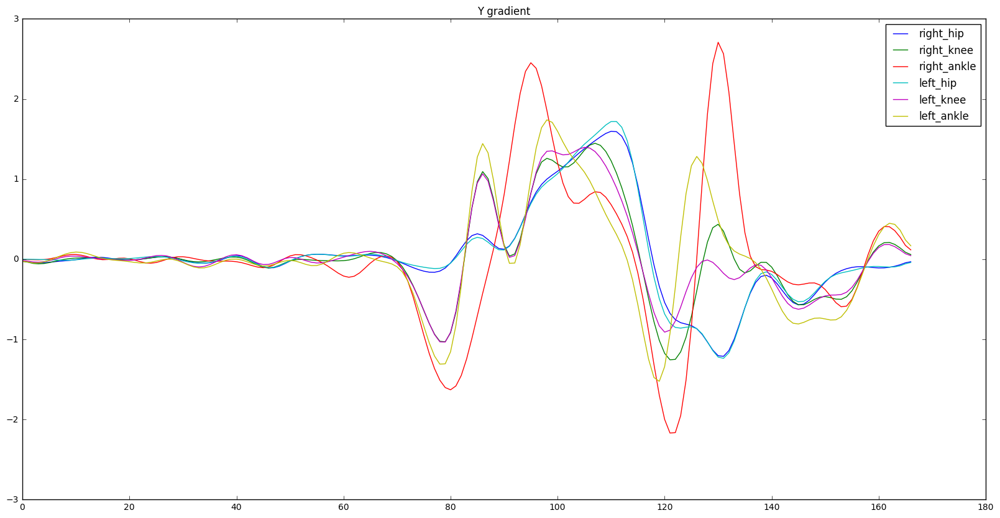

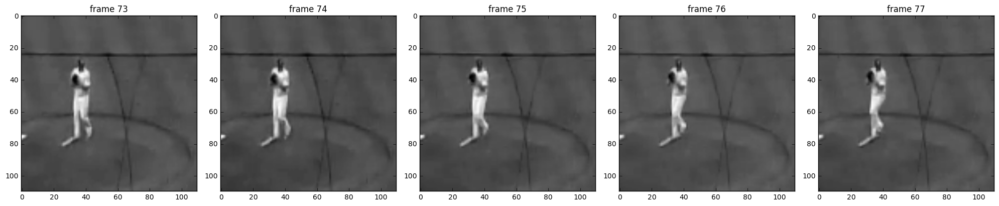

64
491001-27e834cb-2e24-4519-a8f3-1e79641a525d
Stretch


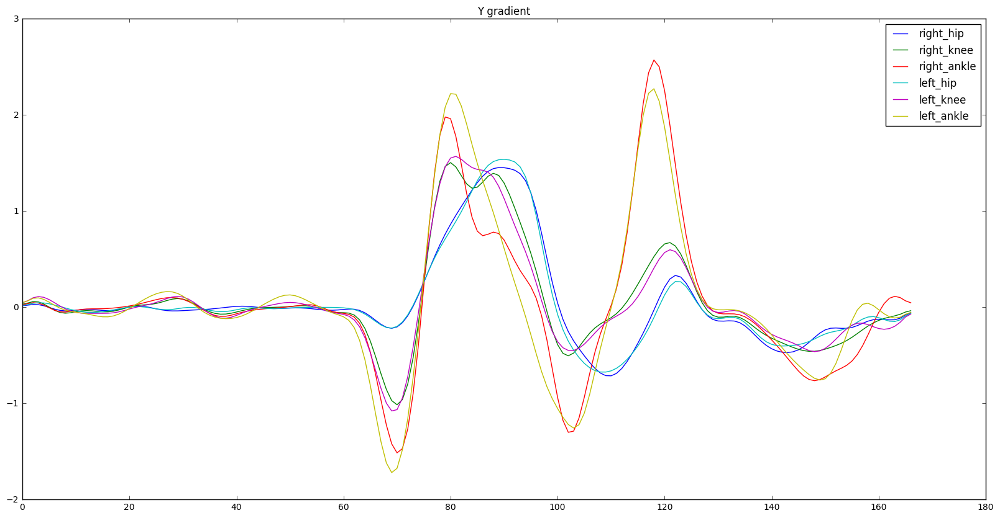

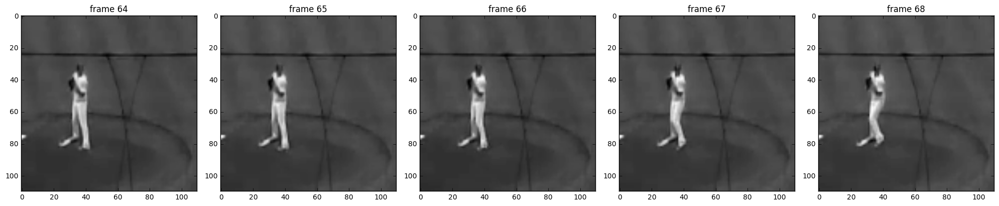

60
491001-b8159960-1d3c-4665-a0b9-583372d70482
Windup


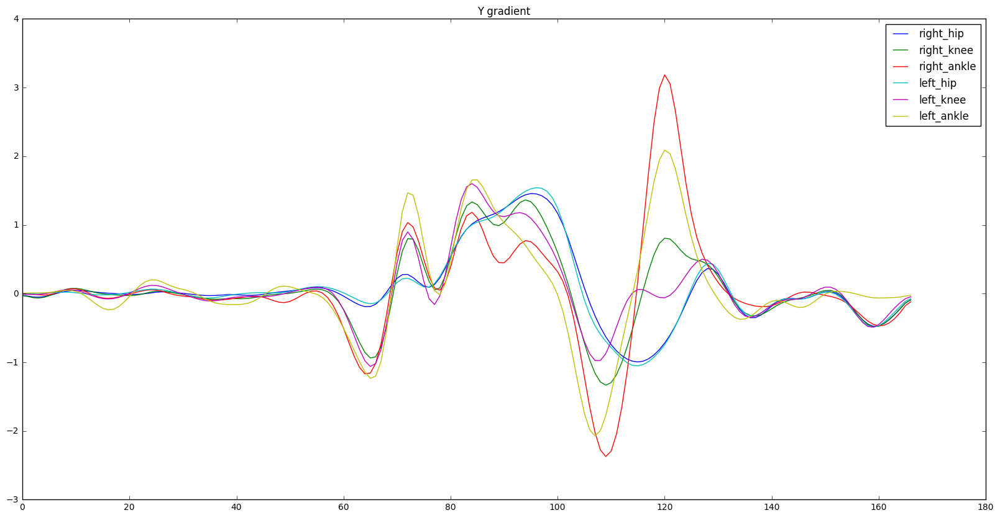

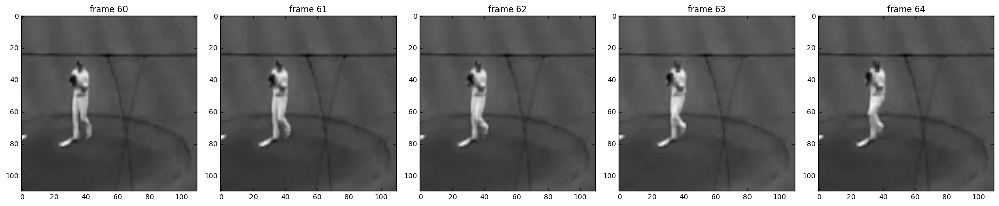

97
491001-6856e2dc-626d-4d9a-9494-e565192d27b7
Stretch


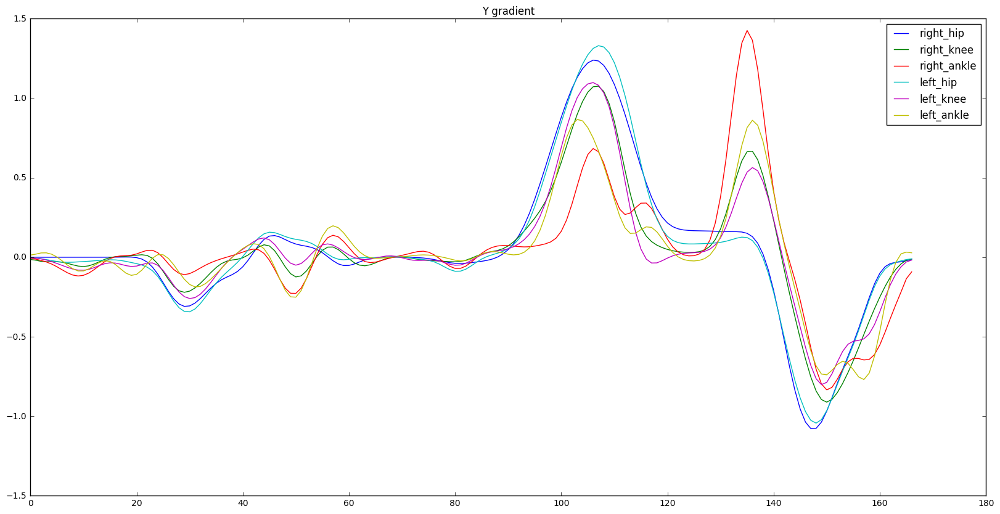

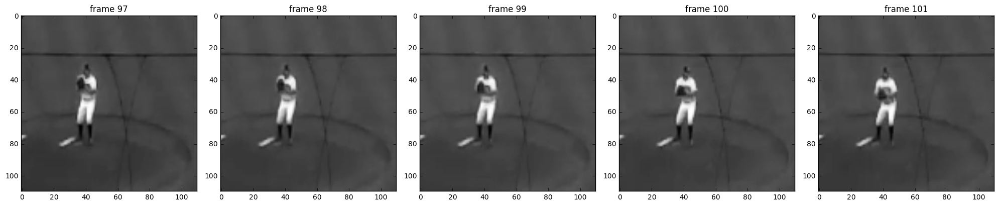

91
491001-75f1a629-bff8-4569-aebd-f6dbf6e90bcd
Windup


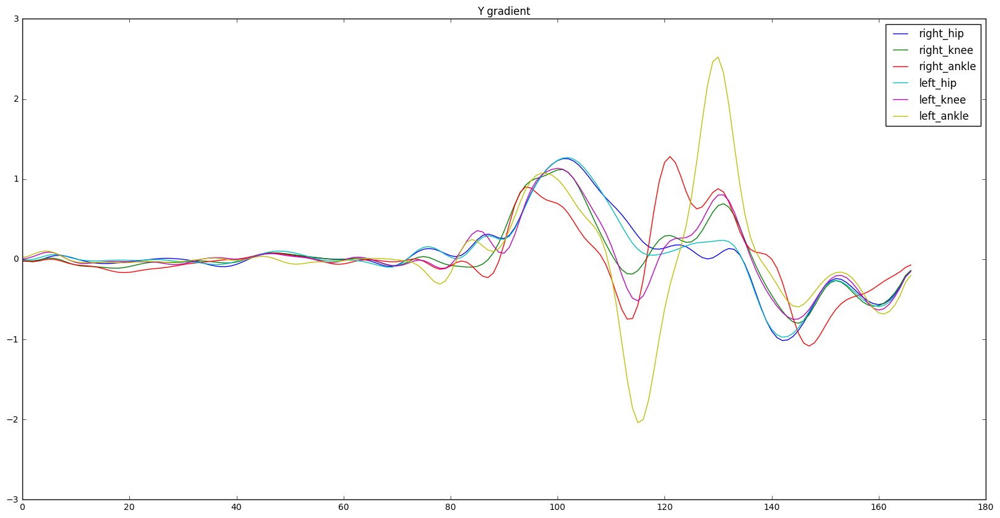

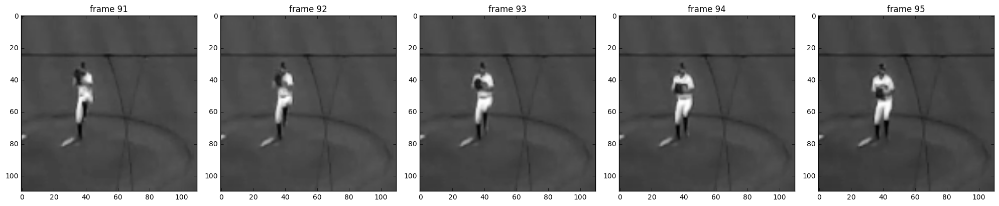

71
491001-2fb29c3d-93d3-4d7e-abeb-be8df331cfb8
Stretch


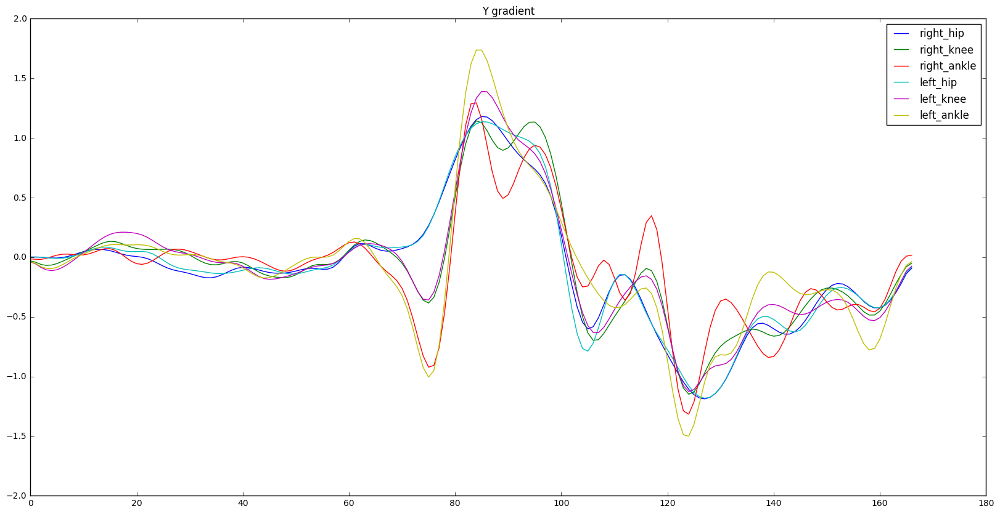

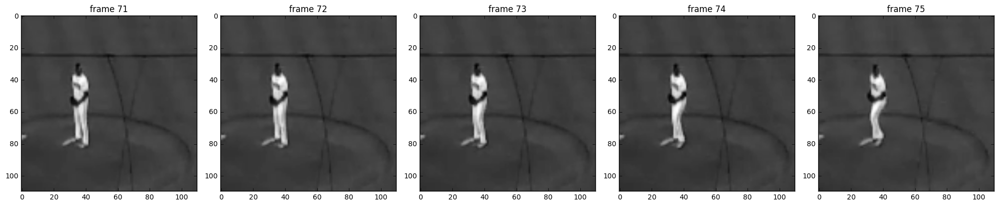

86
491001-f36e1b27-a154-4660-a509-c6e3cfec5e23
Stretch


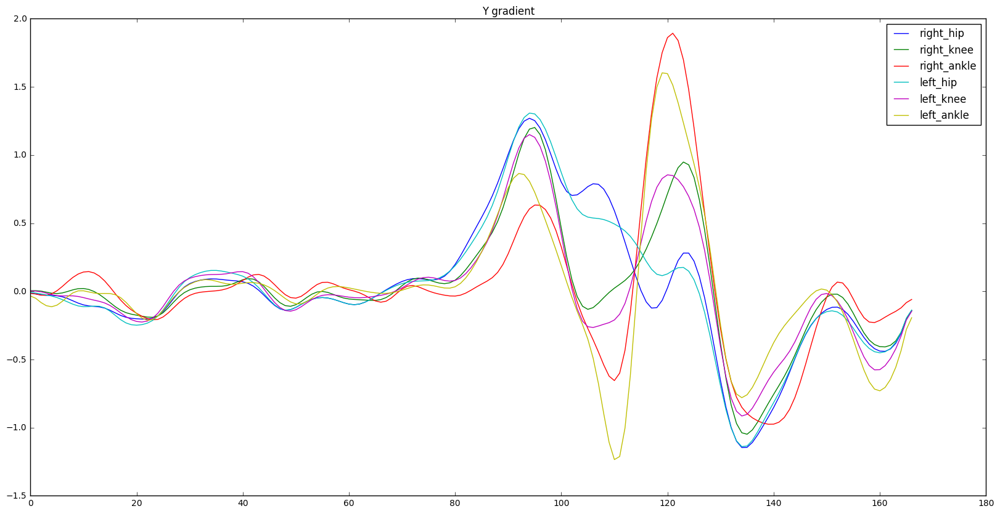

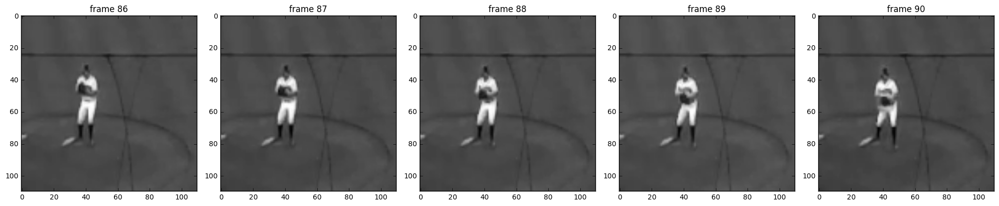

92
491001-9c626d09-0134-4bd5-8805-7938bc7bef57
Windup


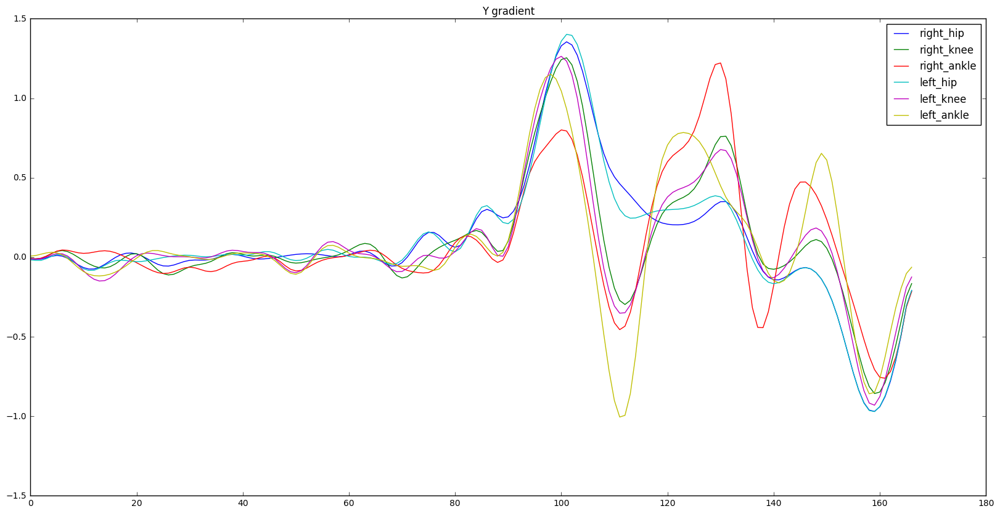

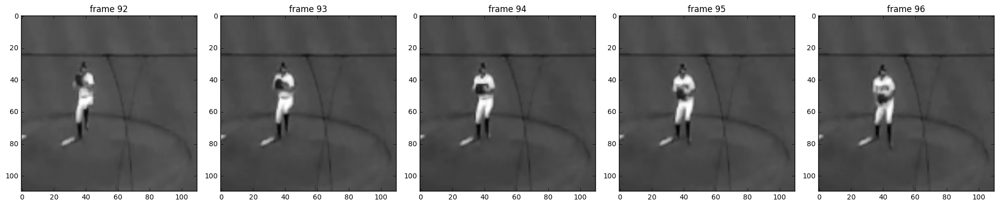

85
491001-f2c12a41-d029-4ca2-87d7-2516c6fe46eb
Windup


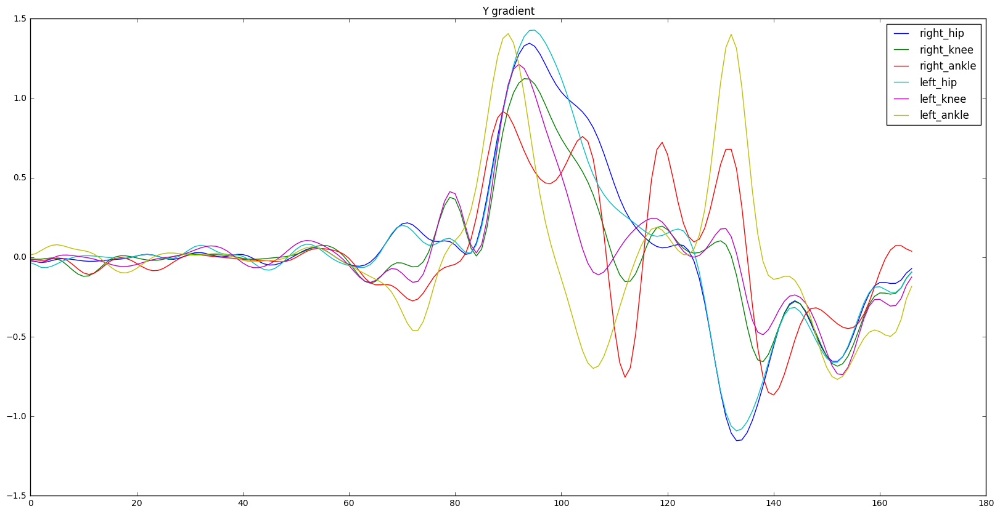

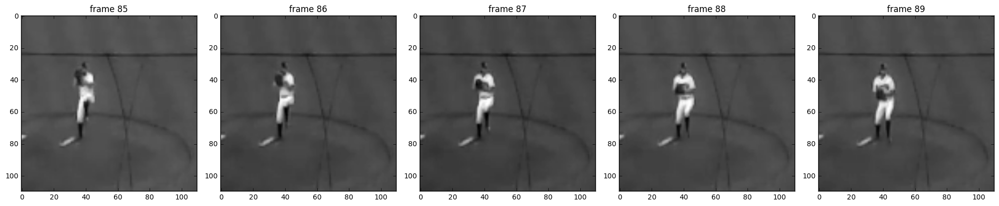

63
491001-f2ce4ccb-db34-4d9b-8800-0c9fa1cf0966
Windup


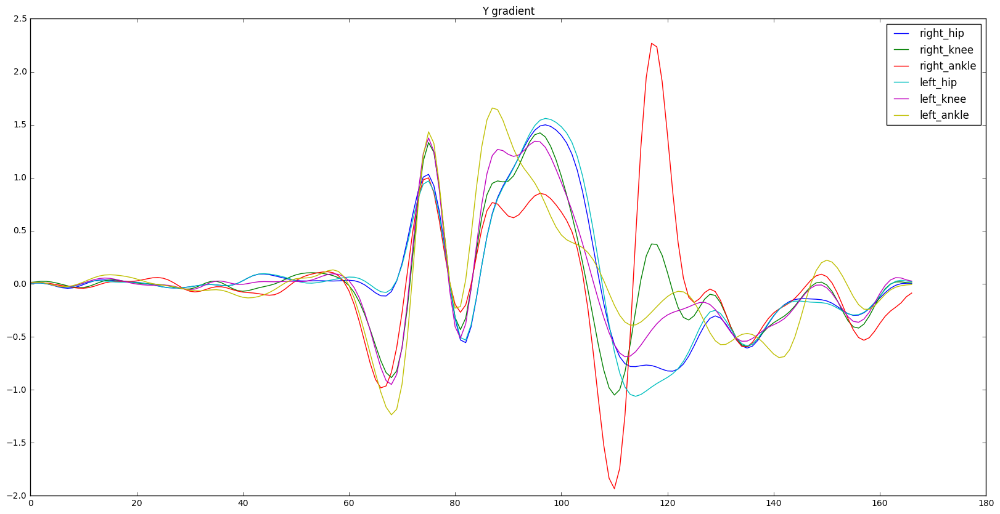

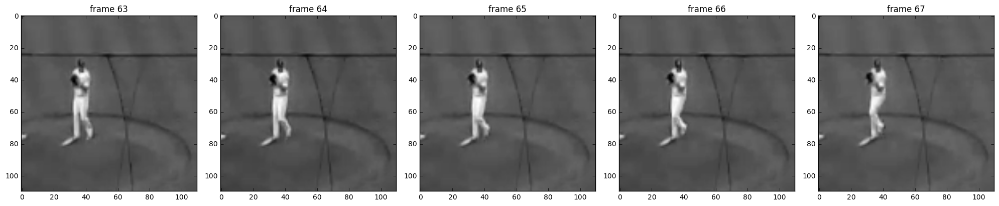

56
491001-42199805-b127-4f6e-b135-149217a8d06d
Windup


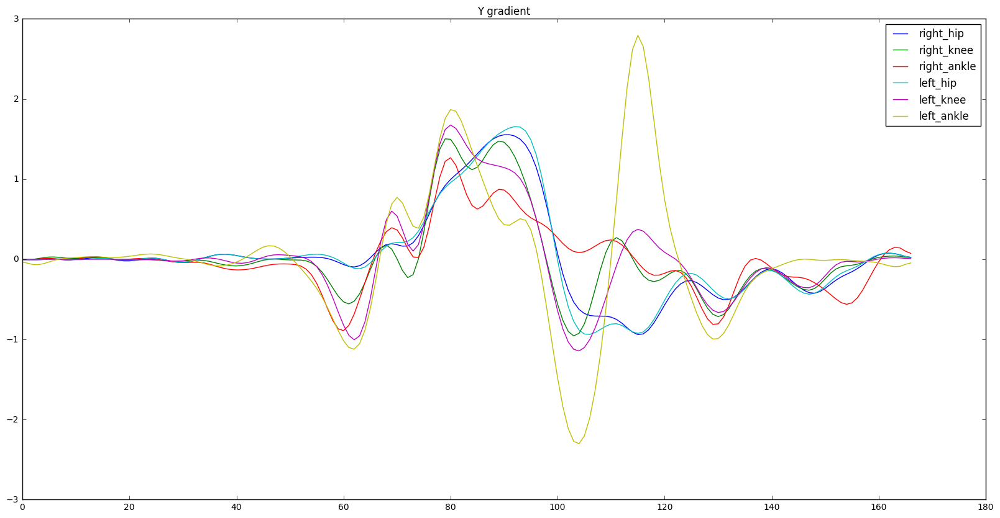

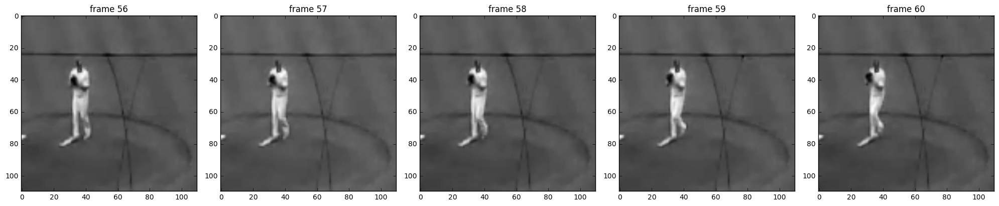

67
491001-7e97154e-1aa7-45a2-a784-640aebec29c4
Windup


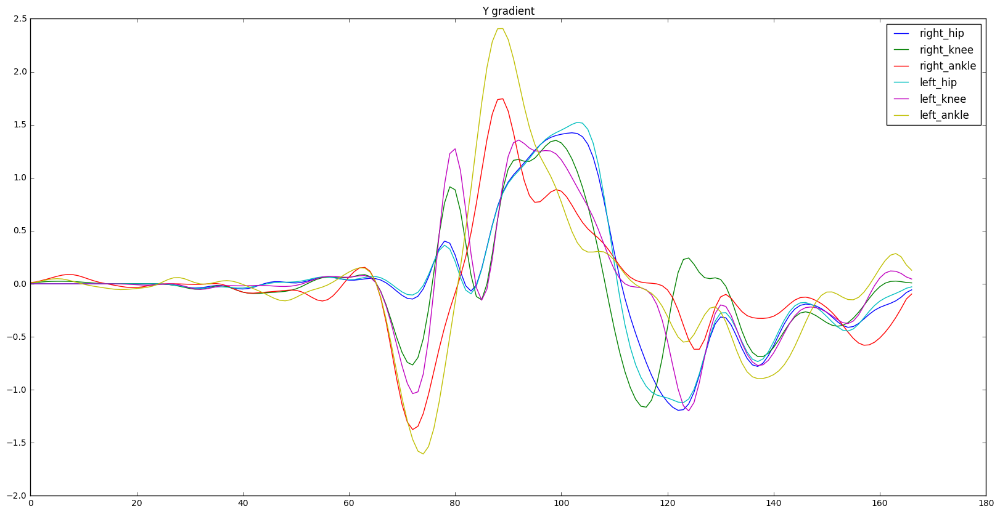

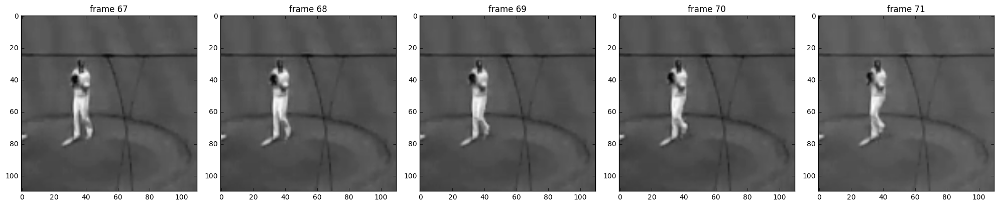

66
491001-3d2fbec5-8135-4e70-aaa7-18b693587057
Stretch


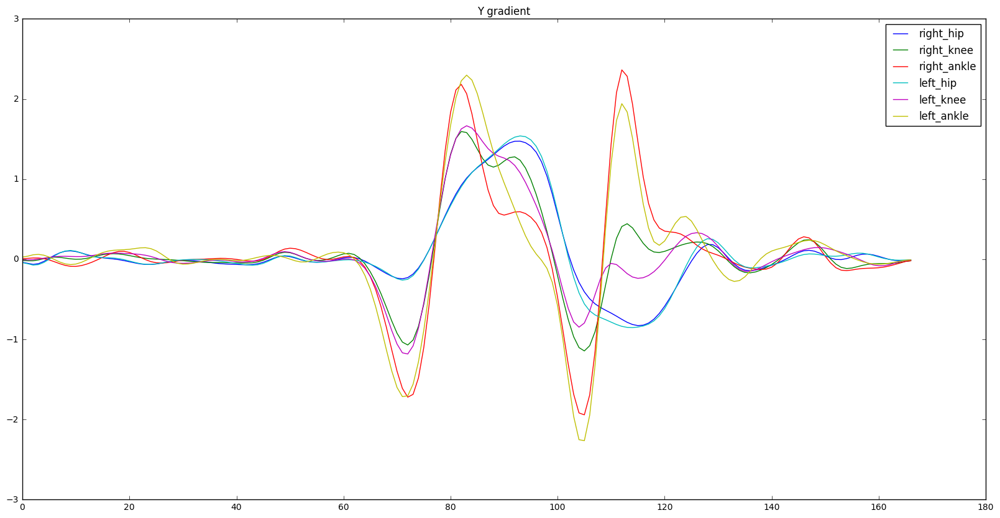

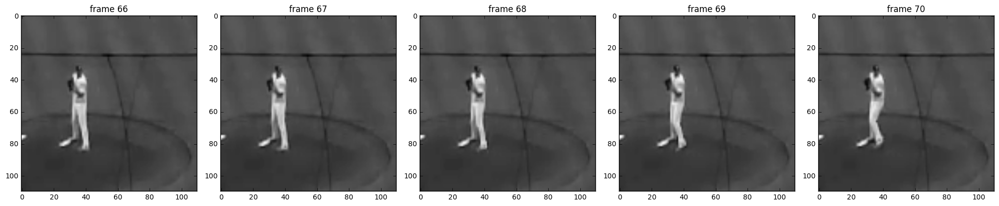

IndexError: index 37 is out of bounds for axis 0 with size 37

In [31]:
#print(joints_array[video_choice,:,joints_list.index(j), 0])

#test_set = joints_array[19,15:23, 7:12, 0]
#print(test_set)
with open("first_move_frames.json", "r") as infile:
    save_list = json.load(infile)

print(len(save_list))
    
for video_choice in range(40): #20):
    relevant_joints = ["right_knee", "right_ankle", "left_knee", "left_ankle"]
    # for weird guy: ["right_shoulder", "left_shoulder", "right_elbow","left_elbow"]
    # first_move = first_leg(joints_array[video_choice,:,:, 0], relevant_joints, -0.3)
    # first_move = first_by_grad(joints_array[video_choice,:,:, 0], relevant_joints, -0.3)
    first_move = grad_sum(joints_array[video_choice,:,:, 0], relevant_joints, 1)
    print(first_move)
    if first_move is None:
        first_move = center_gravity(joints_array[video_choice, :, :12], joint_weights=np.array([1,1, 0.3,0, 0.3, 0, 1, 2,0.5, 1, 2, 0.5]), cutoff = 0.4)
    print(files[video_choice])
    print(pos[video_choice])
    save_list[files[video_choice]] = float(first_move)
    
    plt.figure(figsize = (20,10))
    for j in joints_list[6:12]:
        plt.plot(np.gradient(joints_array[video_choice,:,joints_list.index(j), 0]), label = j)
    plt.legend()
    #plt.ylim(200, 100)
    plt.title("Y gradient")
    plt.show()
    
    fig = plt.figure(figsize=(20, 5))
    show_frames = range(first_move, first_move+5) #[17, 18, 19, 20, 21]
    for ind, i in enumerate(show_frames):
        ax = fig.add_subplot(1,len(show_frames),ind+1)
        plt.imshow(videos_p[video_choice,i])
        plt.gray()
        plt.title("frame "+str(i))
    plt.tight_layout()
    plt.show()

In [32]:
#save_list["491001-85e200b5-1271-4b83-a224-06810e89648a"] = 79

with open("first_move_frames.json", 'w') as outfile:
    json.dump(save_list, outfile)
print(len(save_list))

364


# Batter analysis

In [33]:
videos_b = np.array([np.load("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/video_to_pitchtype_directly/outs/batter_example.npy")])
game_id = "490509-3f640b3f-9ba5-4e89-8f72-97c9f333aa2c"
center_csv = pd.read_csv("/Users/ninawiedemann/Desktop/UNI/Praktikum/ALL/cf_data.csv")
center_csv = center_csv[center_csv["Player"]=="Batter"]
games_batter = center_csv["Game"].values.tolist()
ind = games_batter.index(game_id)
joints_array_batter = np.array([get_data(ind, center_csv)])
joints_array_batter = ndimage.filters.gaussian_filter1d(joints_array_batter, axis =1, sigma = 3)
print(joints_array_batter.shape, videos_b.shape)

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (253,254,255,256,257,258,259,289) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(1, 167, 18, 2) (1, 167, 110, 110)


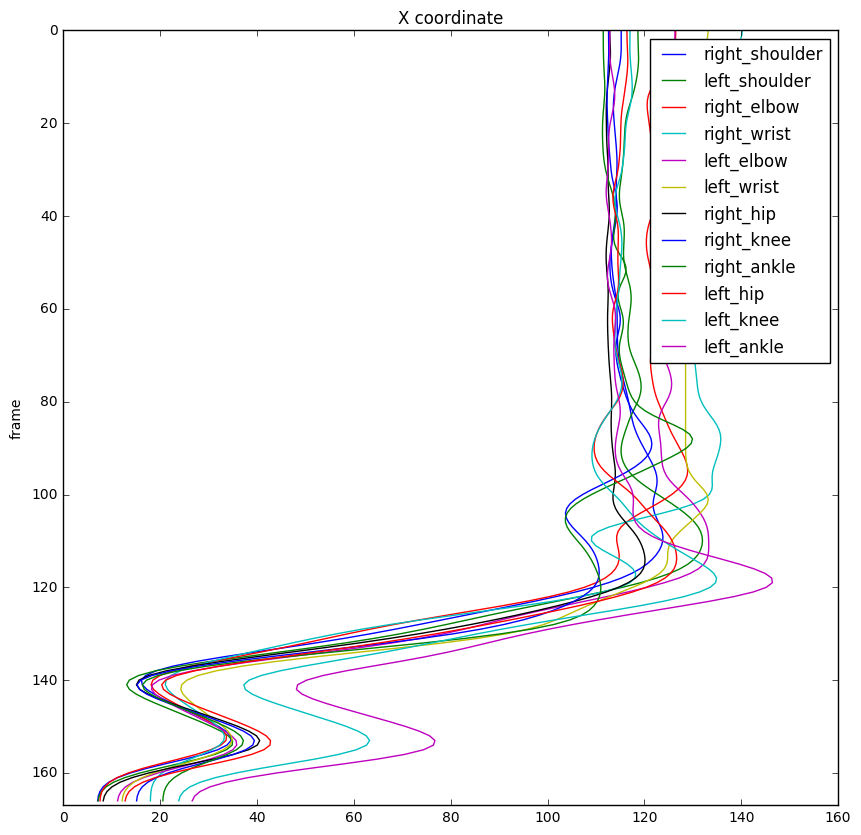

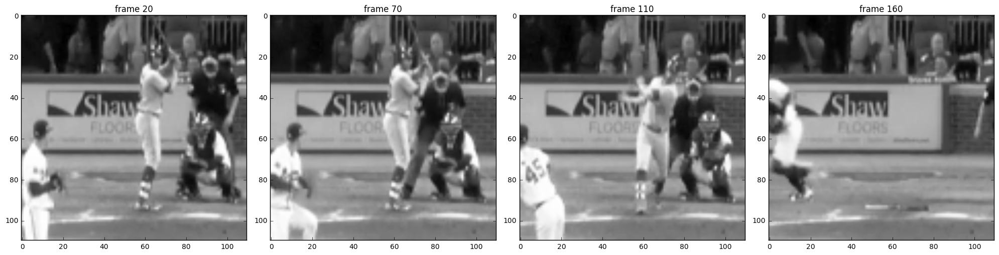

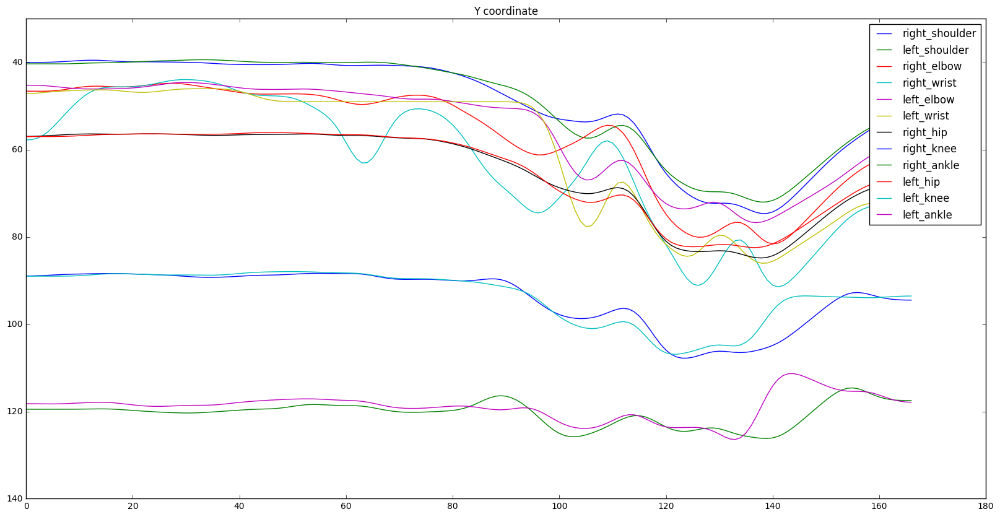

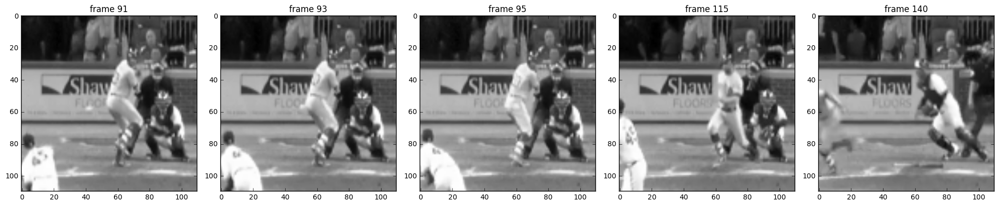

In [34]:
import matplotlib.pylab as plt

joints_list = ["right_shoulder", "left_shoulder", "right_elbow", "right_wrist","left_elbow", "left_wrist",
        "right_hip", "right_knee", "right_ankle", "left_hip", "left_knee", "left_ankle", "neck ",
        "right_eye", "right_ear","left_eye", "left_ear"]
# print(files)
one_joint = "left_knee"
video_choice = 0
#SMOOTHING

plt.figure(figsize = (10,10))
for j in joints_list[:12]:
    plt.plot(joints_array_batter[video_choice,:,joints_list.index(j), 1], np.arange(0,167,1), label = j)
plt.title("X coordinate")
plt.ylim(167,0)
plt.ylabel("frame")
plt.legend()
plt.show()

# Plot video frames to visualize maxima in X coordinates
show_frames = [20, 70, 110, 160]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice,i])
    plt.title("frame "+str(i))
    plt.gray()
plt.tight_layout()
plt.show()


plt.figure(figsize = (20,10))
for j in joints_list[:12]: #[one_joint]: 
    plt.plot(joints_array_batter[video_choice,:,joints_list.index(j), 0], label = j)
plt.legend()
plt.ylim(140, 30)
plt.title("Y coordinate")
plt.show()

# Plot video frames to visualize maxima in Y coordinates
show_frames = [91, 93, 95, 115, 140]
fig = plt.figure(figsize=(20, 5))
for ind, i in enumerate(show_frames):
    ax = fig.add_subplot(1,len(show_frames),ind+1)
    plt.imshow(videos_b[video_choice,i])
    plt.title("frame "+str(i))
plt.tight_layout()
plt.show()

first_by_grad [ 97  98  99 100 101 102 112 113 114 115 116 117 118 119 120 121 122 123
 135 136 137]
--------------START HIT:  97 ------------------
[  2  10  17  33  41  48  56  59  65  72  84  98 111 134 147 158]
[ 98 111 134 147 158]
--------------HIT BALL:  98 ------------------


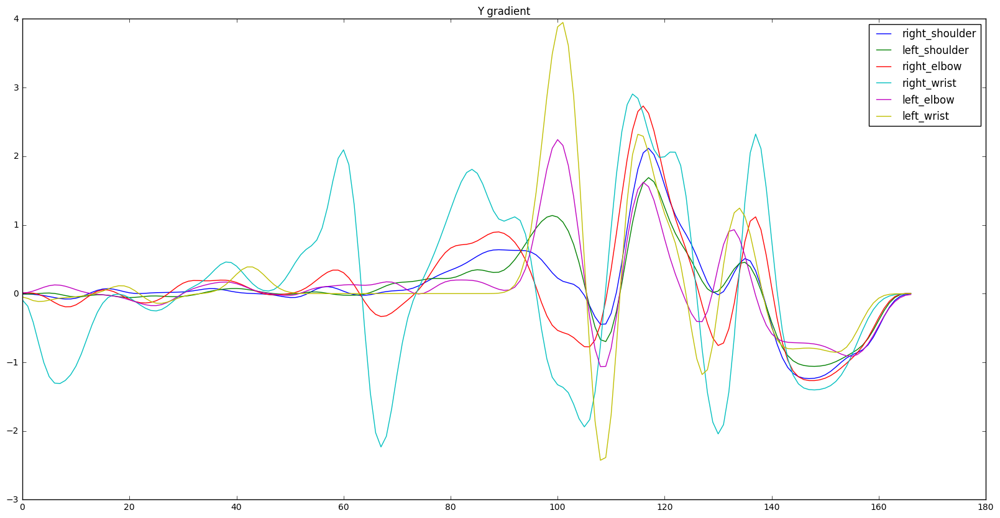

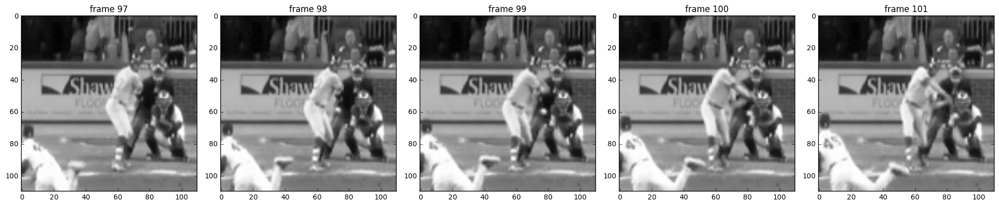

first_by_grad [121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138
 139 155 156 157 158 159 160 161 162]
--------------START RUN:  121 ------------------


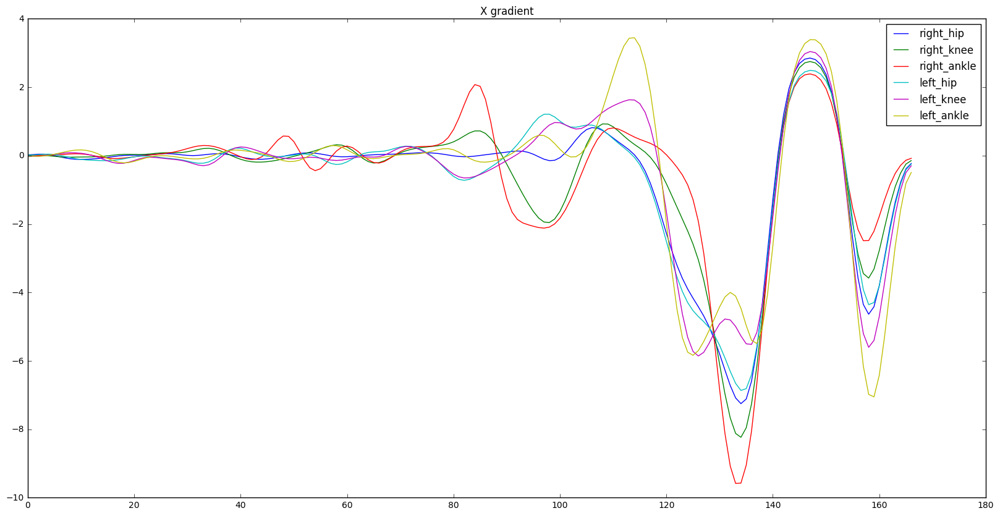

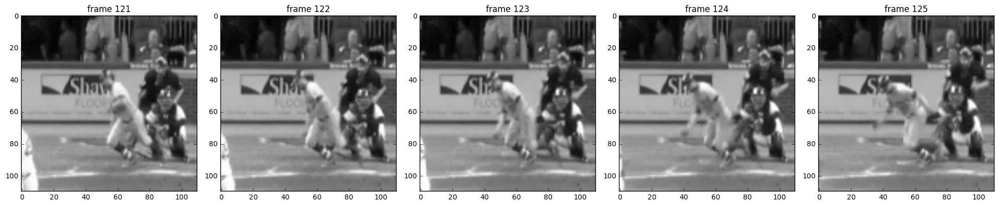

In [49]:
for video_choice in range(0,1):
    
    # first2 = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:12], 1)
    # first_move = min(first1, first2)
    # first_move = center_gravity(joints_array[video_choice, :, :12], joint_weights=np.array([1,1, 0.3,0, 0.3, 0, 1, 2,0.5, 1, 2, 0.5]), cutoff = 0.4)
    # grad_pitcher(joints_array_batter[video_choice,:,joints_list.index(j), 0])[0]
    hit_start = first_by_grad(joints_array_batter[video_choice, :,:, 0], joints_list[:6], 0.7)
    
    print("--------------START HIT: ", hit_start, "------------------")
    
    hit_ball = local_maxima(joints_array_batter[video_choice, :,:, 1], joints_list[6:12], 6)
    print("--------------HIT BALL: ", hit_ball, "------------------")
    plt.figure(figsize = (20,10))
    for j in joints_list[:6]:
        plt.plot(np.gradient(joints_array_batter[video_choice,:,joints_list.index(j), 0]), label = j)
    plt.legend()
    #plt.ylim(200, 100)
    plt.title("Y gradient")
    plt.show()
    fig = plt.figure(figsize=(20, 5))
    show_frames = range(hit_start, hit_start+5) #[17, 18, 19, 20, 21]
    for ind, i in enumerate(show_frames):
        ax = fig.add_subplot(1,len(show_frames),ind+1)
        plt.imshow(videos_b[video_choice,i])
        plt.gray()
        plt.title("frame "+str(i))
    plt.tight_layout()
    plt.show() 
    
    first_move = first_by_grad(joints_array_batter[video_choice, :,:, 1], joints_list[6:12], -2)
    
    print("--------------START RUN: ", first_move, "------------------")
    plt.figure(figsize = (20,10))
    for j in joints_list[6:12]:
        plt.plot(np.gradient(joints_array_batter[video_choice,:,joints_list.index(j), 1]), label = j)
    plt.legend()
    #plt.ylim(200, 100)
    plt.title("X gradient")
    plt.show()

    fig = plt.figure(figsize=(20, 5))
    show_frames = range(first_move, first_move+5) #[17, 18, 19, 20, 21]
    for ind, i in enumerate(show_frames):
        ax = fig.add_subplot(1,len(show_frames),ind+1)
        plt.imshow(videos_b[video_choice,i])
        plt.gray()
        plt.title("frame "+str(i))
    plt.tight_layout()
    plt.show()

# realtime check for first move

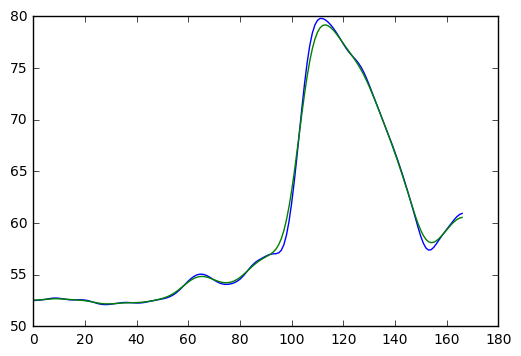

In [31]:
sequ = joints_array[0, :, :6, 0]
smooth = ndimage.filters.gaussian_filter1d(sequ, axis =0, sigma = 3)
# print(sequ.shape)
plt.plot(sequ[:,2])
plt.plot(smooth[:, 2], label = "sm")
plt.show()

first_by_grad [68 69 70]
start
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []
first_by_grad []


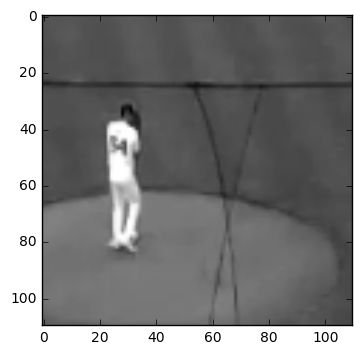

first_by_grad [68]
MOVE


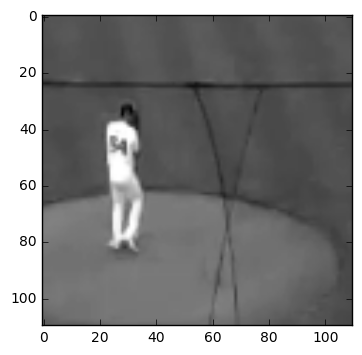

first_by_grad [68 69]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
first_by_grad [68 69 70]
fir

In [30]:
def is_first_move(frames_array, relevant_joints_list, cutoff):
    out = first_by_grad(frames_array, relevant_joints_list, cutoff)
    if out is None:
        return False
    else:
        return out==len(frames_array)-1

example = videos_p[0]
first_by_grad(joints_array[0,:,:,0], relevant_joints, -0.3)
print("start")
relevant_joints = ["right_knee", "right_ankle", "left_knee", "left_ankle"]
for i, fr in enumerate(example):
    #if i>4:
     #   print(is_first_move(joints_array[0,:i+1,:,0], relevant_joints, -0.3))
    if i>4 and is_first_move(joints_array[0,:i+1,:,0], relevant_joints, -0.3):
        print("MOVE")
        plt.imshow(fr)
        plt.show()

# Random stuff

In [36]:
#print(cf_batter.columns.tolist())
col = cf['batter_outcome'].values
nonzero = np.logical_not(pd.isnull(col))
print(len(col), len(games_batter))
print(np.unique(col[nonzero]))
# TEST CURRENT FILES FOR  BATS
for i, filename in enumerate(files):
    game = filename
    ind_batter = games_batter.index(game)
    print(col[ind_batter])
#print(col[np.logical_not(])
for i in range(len(col)):
    if not pd.isnull(col[i]):
        print(games_batter[i], col[i])

9082 4541
['Hit by pitch' 'Strikeout' 'Strikeout - double play' 'Walk']
nan
nan


ValueError: '490972-42281a6b-e082-449f-b8a5-10e1c91456bc' is not in list

In [ ]:
def fastest_arm_move(joints_arr):
    plt.figure(figsize = (20,10))
    for j in range(4):
        plt.plot(np.gradient(joints_array_batter[video_choice,:,j+2, 0]), label = j)
    plt.legend()
    plt.show()
    plt.figure(figsize = (20,10))
    for j in range(4):
        plt.plot(np.gradient(joints_array_batter[video_choice,:,j+2, 1]), label = j)
    plt.legend()
    plt.show()

/Users/ninawiedemann/anaconda/lib/python3.5/site-packages/matplotlib/axes/_axes.py:531: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


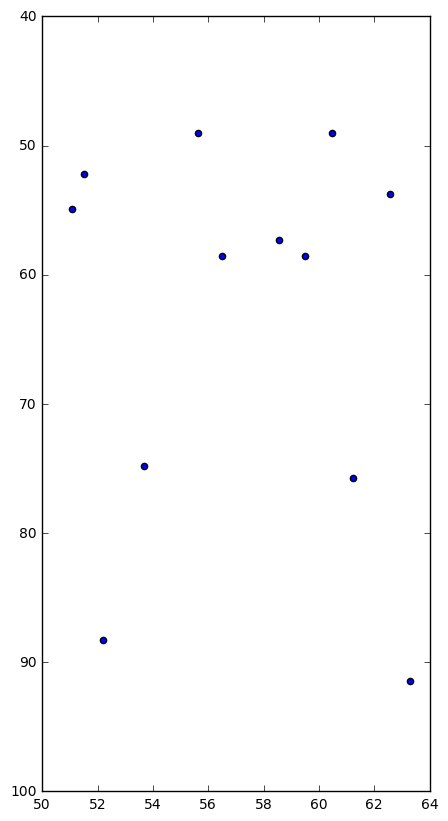

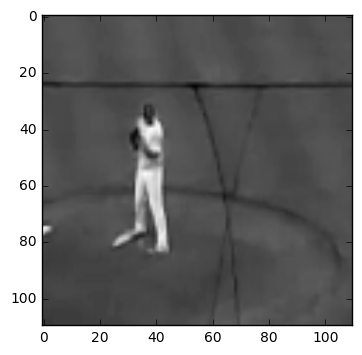

In [54]:
plt.figure(figsize = (5,10))
# for i, j in enumerate(joints_list[:18]):
plt.scatter(joints_array[2, 90, :12, 1], joints_array[2, 90, :12, 0]) #, label=j)
plt.legend(loc="top right")
plt.ylim(100,40)
plt.show()
plt.imshow(videos_p[2,90])
plt.show()

In [ ]:
data = np.load("bsp_data.npy")
lab = np.load("bsp_labels.npy")
data = ndimage.filters.gaussian_filter1d(data, axis =1, sigma = 1)
print(data.shape)
for i in range(10):
    print("------------next---------"," label", lab[i])
    bag = lab[i]//14
    for k in range(14):
        if k ==bag:
            print("HERE MOVE")
        d = data[i*14+k]
        
        gradients = np.array([np.gradient(d[:,j,0], edge_order = 2) for j in range(6)]) 
        print(gradients.shape)
        for j in range(6):
            plt.plot(gradients[j, :])
        plt.show()

        mean_gradient = np.mean(gradients, axis=0)
        #print(mean_gradient)
        move = np.where(mean_gradient<-0.3)[0]
        print(move)

In [115]:
a = list(dic.values())

In [116]:
print(a)

[10, 5, 20]
